# (25) Dataloder -- & Dataset

**Motivation**: Create dataloaders, next I will be ready to fit. <br>

In [1]:
# HIDE CODE


import os, sys
from copy import deepcopy as dc
from os.path import join as pjoin
from IPython.display import display, IFrame, HTML
# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-MTMST/_extras')
fig_base_dir = pjoin(git_dir, 'jb-MTMST/figs')
tmp_dir = pjoin(git_dir, 'jb-MTMST/tmp')
# GitHub
sys.path.insert(0, pjoin(git_dir, '_MTMST'))
from figures.fighelper import *
from model.opticflow import *
# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
from rich.jupyter import print
%matplotlib inline
set_style()

## Trainer

In [2]:
from model.vae2d import VAE
from model.train import TrainerVAE

from torch import _dynamo
_dynamo.config.cache_size_limit = 1024

In [3]:
vae = VAE(ConfigVAE(
    n_kers=4,
    n_latent_scales=3, n_groups_per_scale=20, n_latent_per_group=3,
    n_pre_blocks=0, n_post_cells=3, n_cells_per_cond=2,
    spectral_norm=0, ada_groups=True,
))
tr = TrainerVAE(
    model=torch.compile(vae),
    # model=vae,
    cfg=ConfigTrain(
        lr=0.001, batch_size=512, epochs=1000, grad_clip=2000,
        lambda_anneal=True, lambda_norm=1, optimizer_kws={'eps': 1e-3},
        kl_beta=0.25, kl_anneal_cycles=1),
    device='cuda',
)
vae.cfg.total_latents() 

105

In [4]:
vae.print()
vae.scales

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|     VAE     |  10.9 Mil  |
|     ---     |    ---     |
|     stem    |   1.1 K    |
|     pre     |     0      |
|  enc_tower  |  5.6 Mil   |
| enc_sampler |  1.3 Mil   |
| dec_sampler |  1.3 Mil   |
|    expand   |   52.7 K   |
|  dec_tower  |  2.6 Mil   |
|     post    |   10.3 K   |
|     out     |    290     |
|  cos_recon  |     0      |
|   l2_recon  |     0      |
|   l1_recon  |     0      |
|  l1_weight  |     0      |
+-------------+------------+

[16, 8, 4]

In [5]:
len(vae.all_log_norm)

225

In [6]:
scales, level_ids = vae.latent_scales()
level_ids

{'idx-0_scale-4_group-0': range(0, 3),
 'idx-1_scale-4_group-1': range(3, 6),
 'idx-2_scale-4_group-2': range(6, 9),
 'idx-3_scale-4_group-3': range(9, 12),
 'idx-4_scale-4_group-4': range(12, 15),
 'idx-5_scale-8_group-0': range(15, 18),
 'idx-6_scale-8_group-1': range(18, 21),
 'idx-7_scale-8_group-2': range(21, 24),
 'idx-8_scale-8_group-3': range(24, 27),
 'idx-9_scale-8_group-4': range(27, 30),
 'idx-10_scale-8_group-5': range(30, 33),
 'idx-11_scale-8_group-6': range(33, 36),
 'idx-12_scale-8_group-7': range(36, 39),
 'idx-13_scale-8_group-8': range(39, 42),
 'idx-14_scale-8_group-9': range(42, 45),
 'idx-15_scale-16_group-0': range(45, 48),
 'idx-16_scale-16_group-1': range(48, 51),
 'idx-17_scale-16_group-2': range(51, 54),
 'idx-18_scale-16_group-3': range(54, 57),
 'idx-19_scale-16_group-4': range(57, 60),
 'idx-20_scale-16_group-5': range(60, 63),
 'idx-21_scale-16_group-6': range(63, 66),
 'idx-22_scale-16_group-7': range(66, 69),
 'idx-23_scale-16_group-8': range(69, 72),


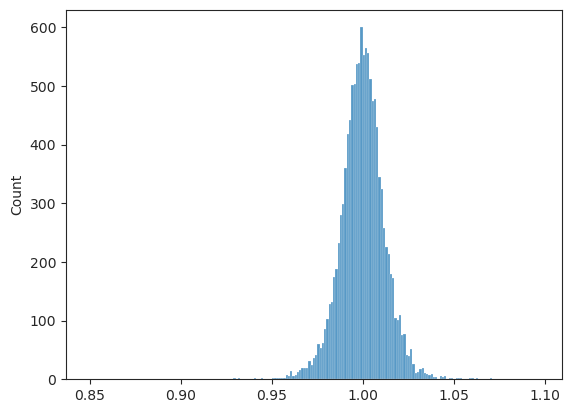

In [7]:
all_norm = to_np(torch.cat(vae.all_log_norm).exp())
sns.histplot(all_norm);

In [8]:
len(vae.all_log_norm)

225

In [9]:
tr.cfg.warmup_portion

0.01

In [10]:
vae.cfg.residual_kl

True

In [11]:
tr.optim

Adamax (
Parameter Group 0
    betas: (0.9, 0.999)
    differentiable: False
    eps: 0.001
    foreach: None
    initial_lr: 0.001
    lr: 0.001
    maximize: False
    weight_decay: 0.0001
)

In [12]:
tr.alphas = None

## Review train options

In [13]:
print(f"VAE:\t\t{vae.cfg.name()}\nTrainer:\t{tr.cfg.name()}")

VAE:            k-32_z-3x[5,10,20]_cells-2_post-1x3
Trainer:        ep1000-b512-lr(0.001)_beta(0.25)-anneal(1x0.3)_lambda(1)_grad(2000)

## Train

In [ ]:
comment = f"kl:NoBal-eps:1e-3_warmup:0.01_{tr.cfg.name()}"
tr.train(comment=comment)

epoch # 850, avg loss: 14.108264:  85%|████████▍ | 849/1000 [14:58:48<2:22:28, 56.61s/it]

epoch # 1000, avg loss: 12.693488: 100%|██████████| 1000/1000 [18:44:04<00:00, 67.44s/it]


In [10]:
# comment = f"NoSpectNorm-BugFix(equi:KABA-cuda1)-Cell:skip+x-Clip300_{tr.cfg.name()}"
# tr.train(comment=comment)

epoch # 1000, avg loss: 13.989520: 100%|██████████| 1000/1000 [17:34:15<00:00, 63.26s/it]


In [ ]:
# before: epoch # 1000, avg loss: 12.994576

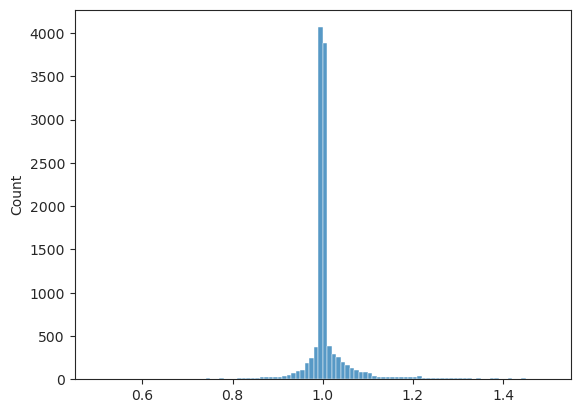

In [13]:
all_norm = [torch.exp(n.ravel()) for n in vae.all_log_norm]
all_norm = to_np(torch.cat(all_norm))
sns.histplot(all_norm, bins=np.linspace(0.5, 1.5, 101));

In [14]:
np.max(all_norm), 100 * (all_norm > 1.5).sum() / len(all_norm), 100 * (all_norm < 0.5).sum() / len(all_norm)

(6.342939, 2.0474137931034484, 0.0)

In [15]:
from model.vae2d import *

In [18]:
norms = collections.defaultdict(list)
norms['stem'] = list(to_np(vae.stem.log_weight_norm.exp()))

for cell in vae.enc_tower:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms[f"{type(cell).__name__}_enc"].extend(
                list(to_np(m.log_weight_norm.exp())))

for cell in vae.dec_tower:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms[f"{type(cell).__name__}_dec"].extend(
                list(to_np(m.log_weight_norm.exp())))

for cell in vae.enc_sampler:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms['enc_sampler'].extend(
                list(to_np(m.log_weight_norm.exp())))

for cell in vae.dec_sampler:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms['dec_sampler'].extend(
                list(to_np(m.log_weight_norm.exp())))

for cell in vae.expand:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms['expand'].extend(
                list(to_np(m.log_weight_norm.exp())))

for cell in vae.post:
    for m in cell.modules():
        if hasattr(m, 'log_weight_norm'):
            norms[f"{type(cell).__name__}_post"].extend(
                list(to_np(m.log_weight_norm.exp())))

norms = dict(sorted(norms.items()))

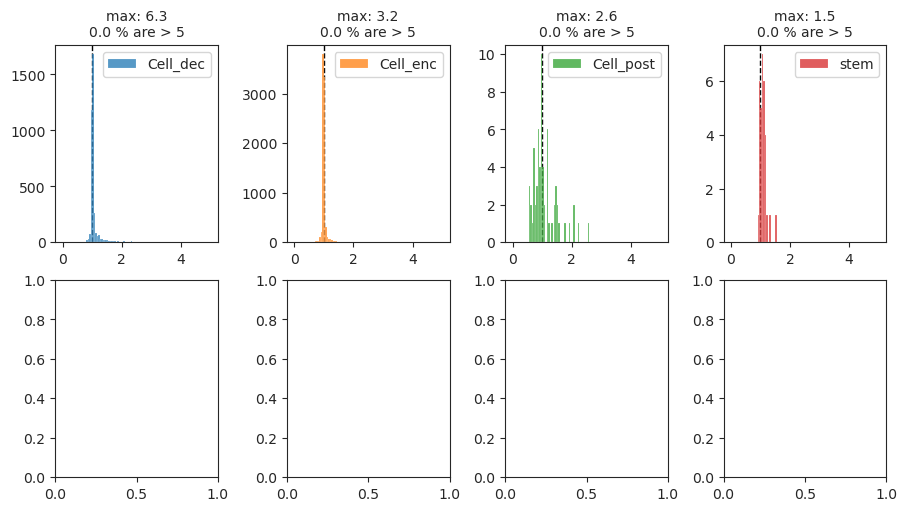

In [19]:
fig, axes = create_figure(2, 4, (9, 5), constrained_layout=True)
for i, (k, v) in enumerate(norms.items()):
    ax = axes.flat[i]
    ax.axvline(1, color='k', ls='--', lw=1.0, zorder=0)
    sns.histplot(v, color=f"C{i}", bins=np.linspace(0, 5, 101), label=k, ax=ax)
    title = f"max: {np.max(v):0.1f}\n{100 * (np.array(v) > 5).sum() / len(v):0.1f} % are > 5"
    ax.set_title(title, fontsize=10)
    ax.set_ylabel('')
    ax.legend()
plt.show()

In [21]:
val, loss = tr.validate(n_samples=4096)
{k: v.mean() for k, v in loss.items()}

{'kl': 39.5488,
 'l1': 0.5251577,
 'l2': 0.19717647,
 'epe': 2.219914,
 'cos': 3.7904382}

In [ ]:
print(f"VAE:\t\t{vae.cfg.name()}\nTrainer:\t{tr.cfg.name()}")

In [22]:
vae.cfg.name()

'k-32_z-3x[5,10,20]_cells-2_post-1x3_sn-1'

fig/sample

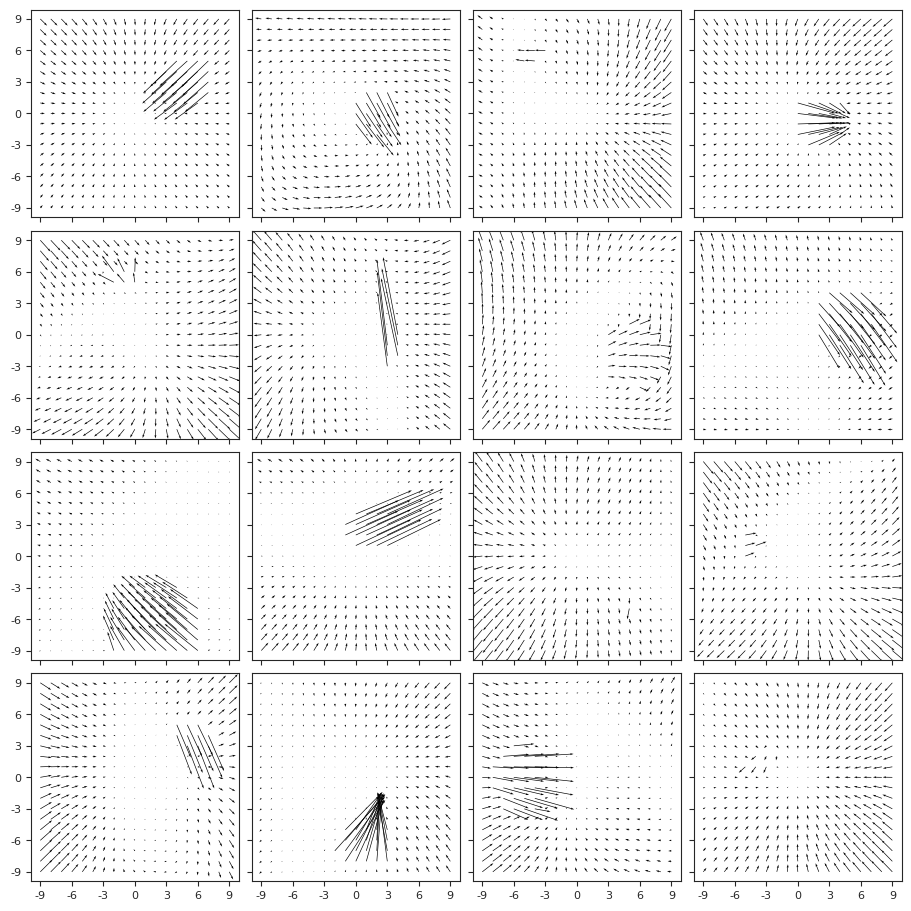

fig/corr_z

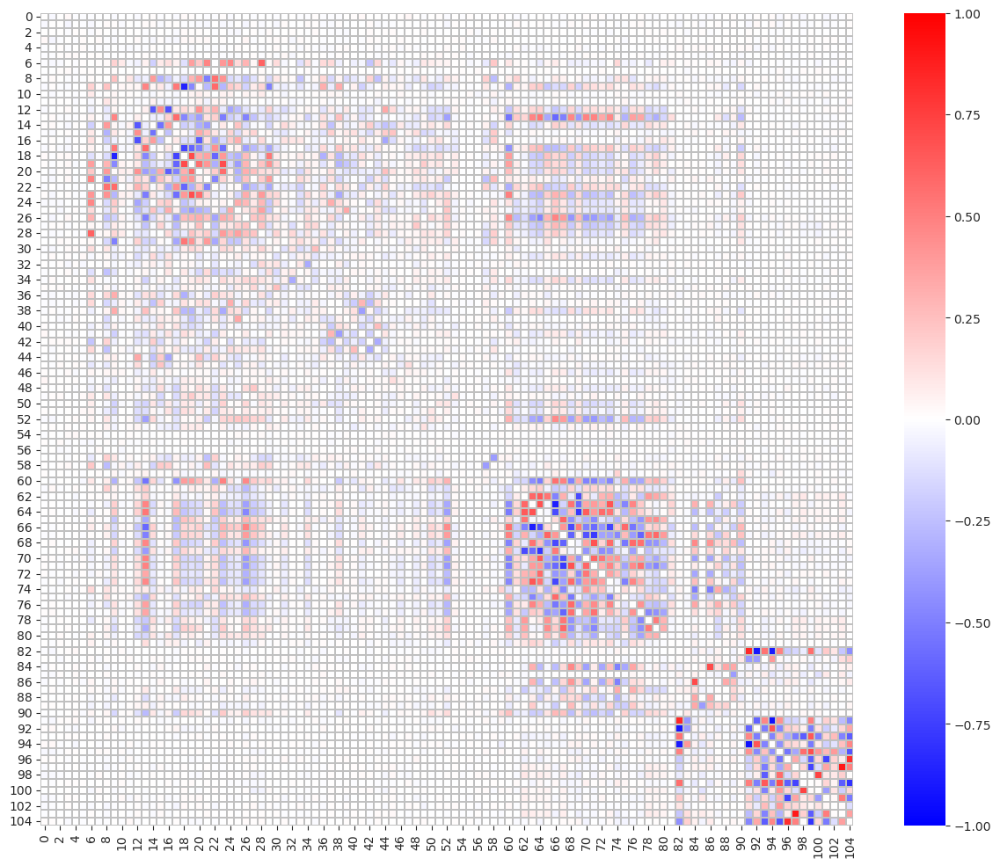

fig/regression

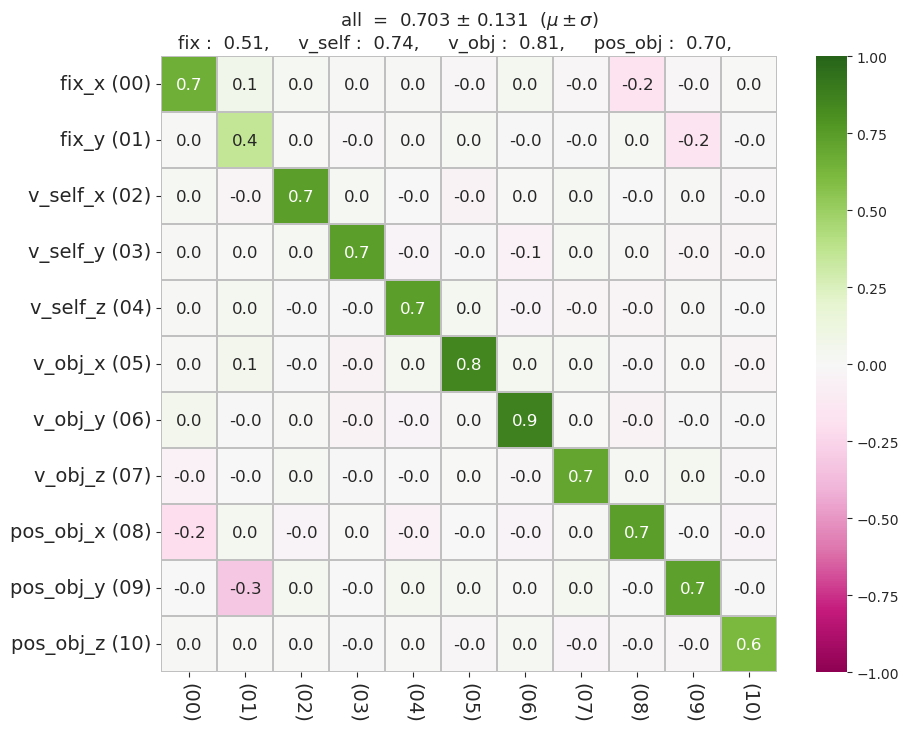

fig/mutual_info

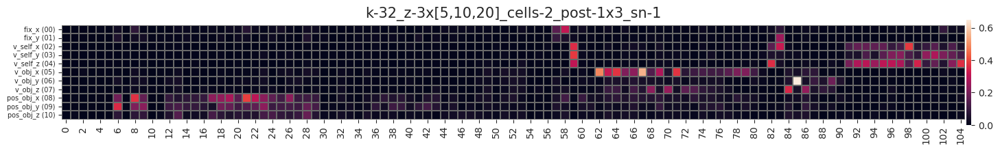

fig/hist_z

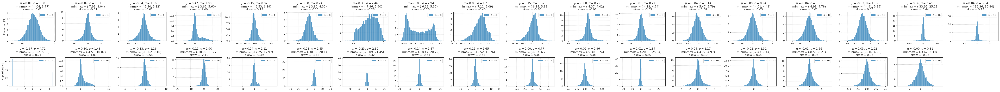

fig/hist_x_sample

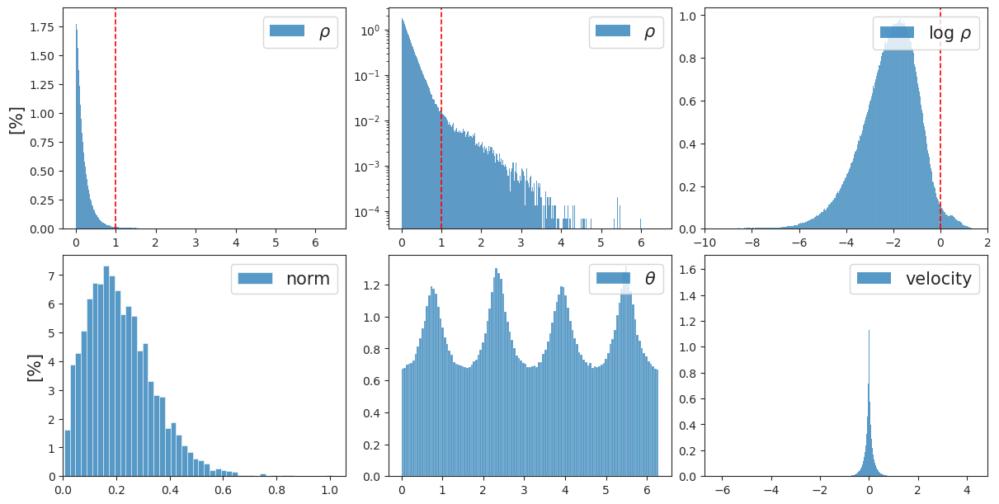

In [23]:
for k, v in val.items():
    if 'fig' in k:
        print(k)
        display(v)

{'kl': 40.573006,
 'l1': 0.7668358,
 'l2': 0.283946,
 'epe': 2.691028,
 'cos': 5.166852}

'k-40_z-3x[5,10,20]_cells-2_post-1x3'

fig/sample

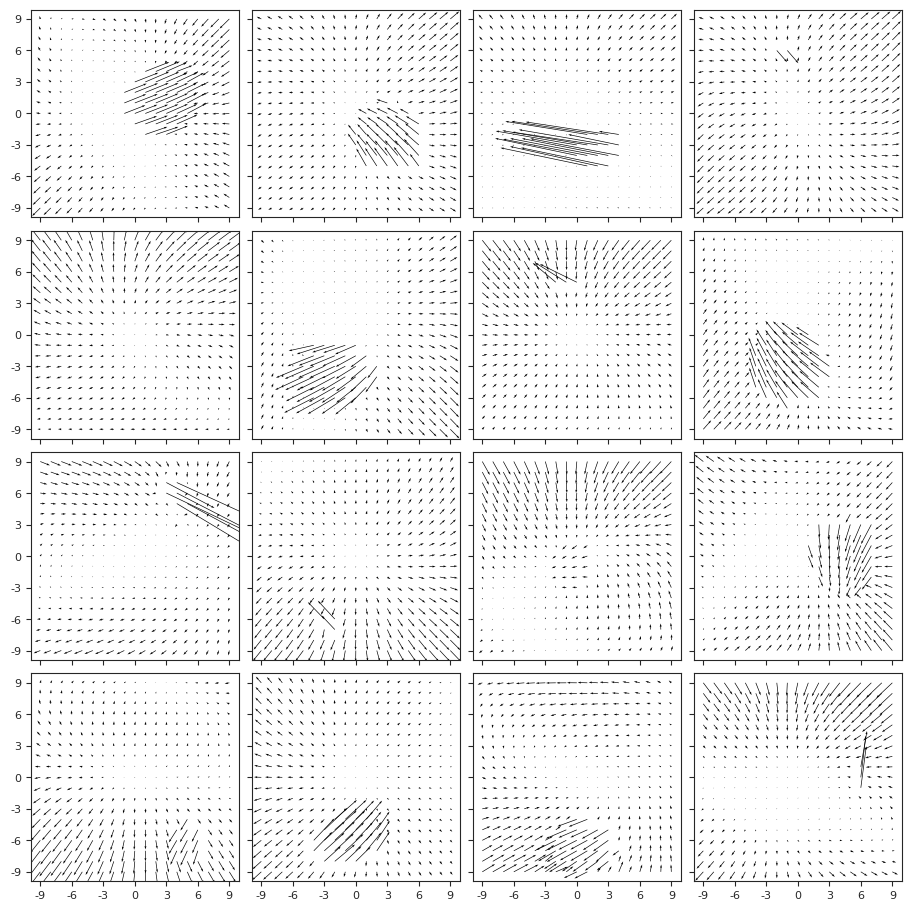

fig/corr_z

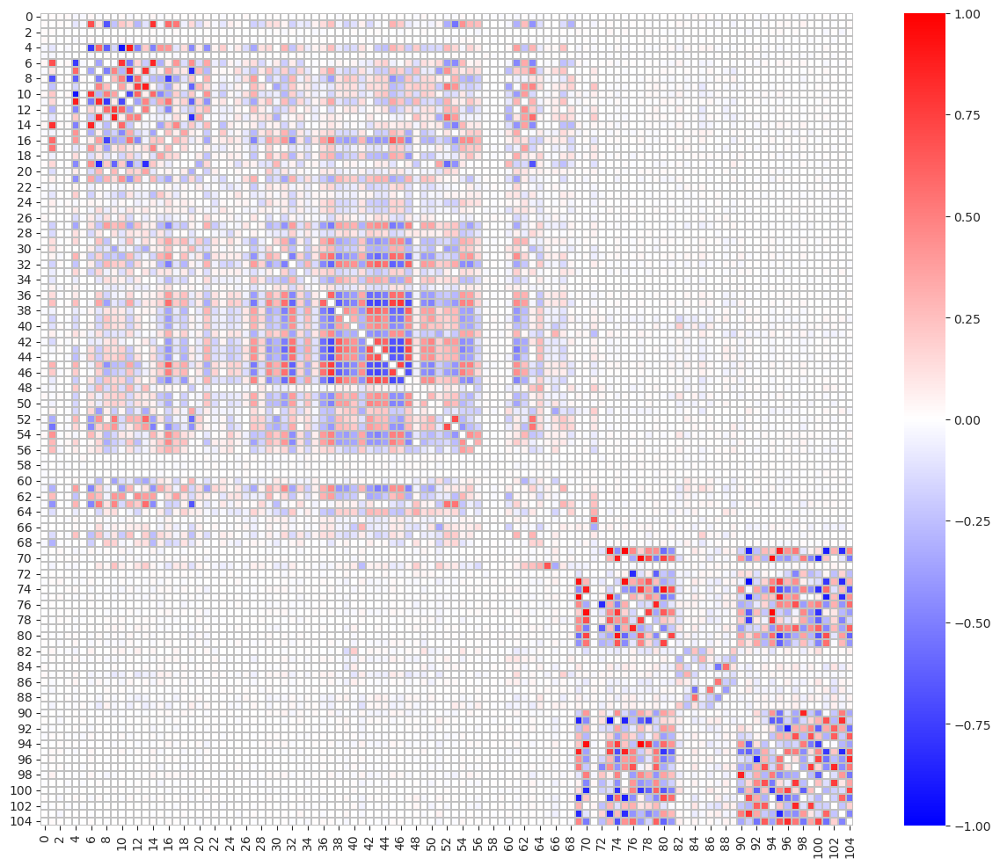

fig/regression

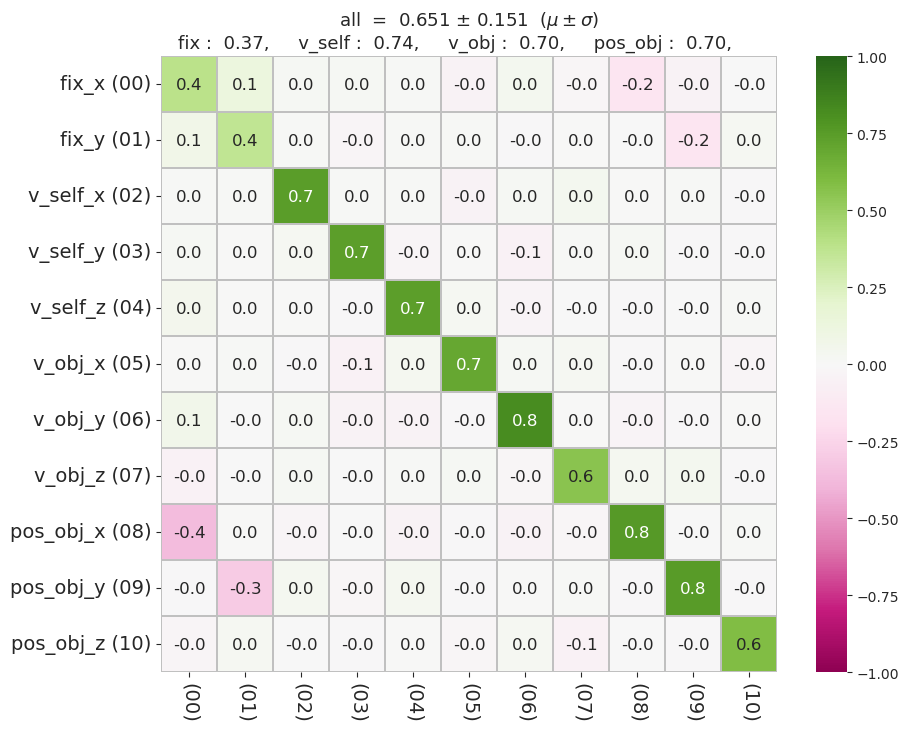

fig/mutual_info

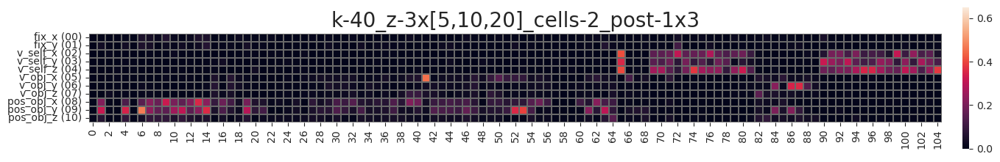

fig/hist_z

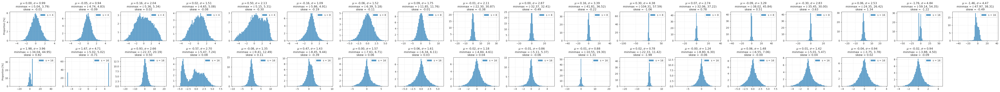

fig/hist_x_sample

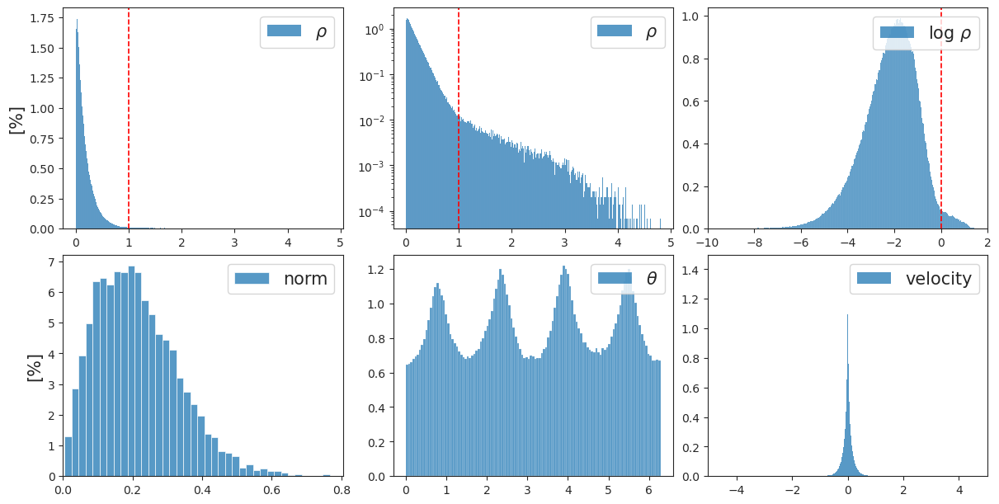

In [29]:
vae.enc_tower[51].ops[1].conv.log_weight_norm.exp()

tensor([0.7456, 0.7770, 0.7388, 0.6777, 0.8480, 0.7801, 0.6696, 0.8134, 0.7437,
        0.7375, 0.7078, 0.7894, 0.6656, 0.7543, 0.7170, 0.6750, 0.7204, 0.7756,
        0.7485, 0.7165, 0.7159, 0.7198, 0.7240, 0.7700, 0.7824, 0.6420, 0.6514,
        0.6990, 0.6744, 0.7830, 0.7067, 0.6656, 0.7208, 0.6960, 0.9064, 0.7239,
        0.7183, 0.7239, 0.7136, 0.7120], device='cuda:0',
       grad_fn=<ExpBackward0>)

In [30]:
print(vae)

VAE(
  (stem): ParametrizedConv2d(
    2, 40, kernel_size=(4, 4), stride=(1, 1), padding=valid
    (parametrizations): ModuleDict(
      (weight): ParametrizationList(
        (0): _SpectralNorm()
      )
    )
  )
  (pre): ModuleList()
  (enc_tower): ModuleList(
    (0-1): 2 x Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
      )
      (se): SELayer(
        (pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=40, out_features=4, bias=True)
          (1): SiLU()
          (2): Linear(in_features=4, out_features=40, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (2): CombinerEnc(
      (conv): ParametrizedConv2d(
        40, 40, kernel_size=(1, 1), stride=(1, 1)
        (parametrizations): ModuleDict(
          (weight): ParametrizationList(
            (0): _SpectralNorm()
          )
        )
      )
    )
    (3-4): 2 x Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
      )
      (se): SELayer(
        (pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=40, out_features=4, bias=True)
          (1): SiLU()
          (2): Linear(in_features=4, out_features=40, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (5): CombinerEnc(
      (conv): ParametrizedConv2d(
        40, 40, kernel_size=(1, 1), stride=(1, 1)
        (parametrizations): ModuleDict(
          (weight): ParametrizationList(
            (0): _SpectralNorm()
          )
        )
      )
    )
    (6-7): 2 x Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
      )
      (se): SELayer(
        (pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=40, out_features=4, bias=True)
          (1): SiLU()
          (2): Linear(in_features=4, out_features=40, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (8): CombinerEnc(
      (conv): ParametrizedConv2d(
        40, 40, kernel_size=(1, 1), stride=(1, 1)
        (parametrizations): ModuleDict(
          (weight): ParametrizationList(
            (0): _SpectralNorm()
          )
        )
      )
    )
    (9-10): 2 x Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
      )
      (se): SELayer(
        (pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=40, out_features=4, bias=True)
          (1): SiLU()
          (2): Linear(in_features=4, out_features=40, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (11): CombinerEnc(
      (conv): ParametrizedConv2d(
        40, 40, kernel_size=(1, 1)

In [36]:
vae.enc_tower[0].ops[1]

ConvLayer(
  (act_fn): SiLU()
  (conv): ParametrizedConv2D(
    40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
    (parametrizations): ModuleDict(
      (weight): ParametrizationList(
        (0): _SpectralNorm()
      )
    )
  )
)

In [37]:
len(vae.enc_tower[0].ops)

2

{'kl': 38.412567,
 'l1': 0.83019793,
 'l2': 0.3623751,
 'epe': 2.7295651,
 'cos': 4.987573}

fig/sample

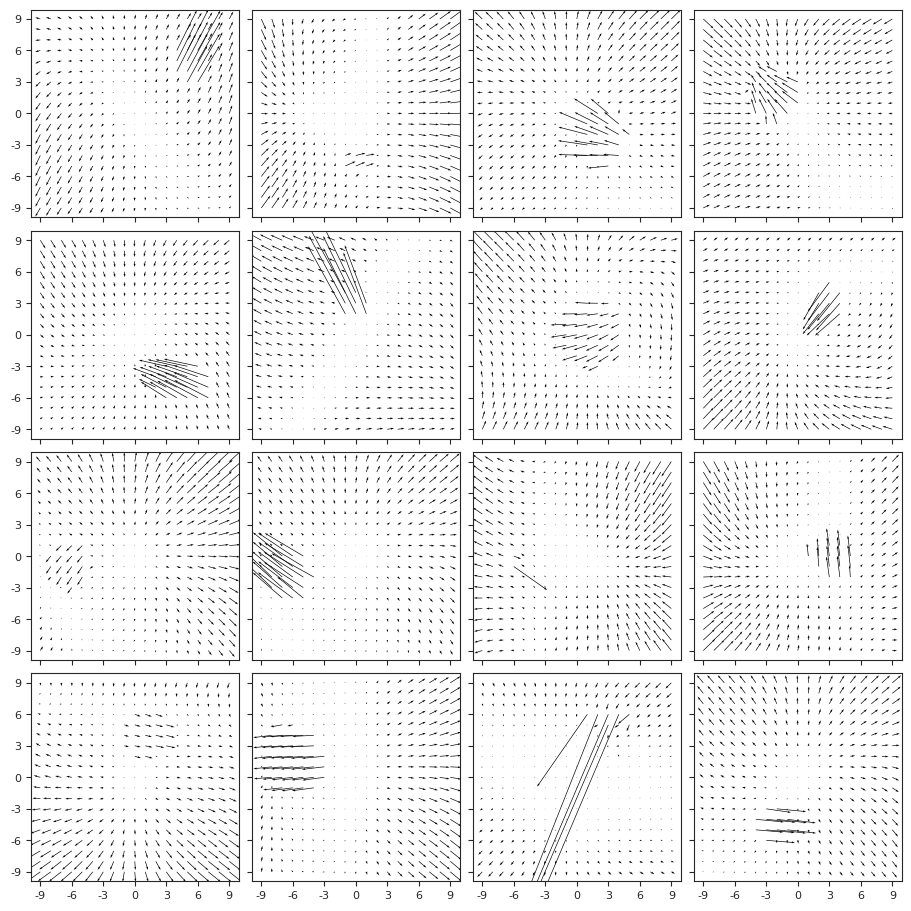

fig/corr_z

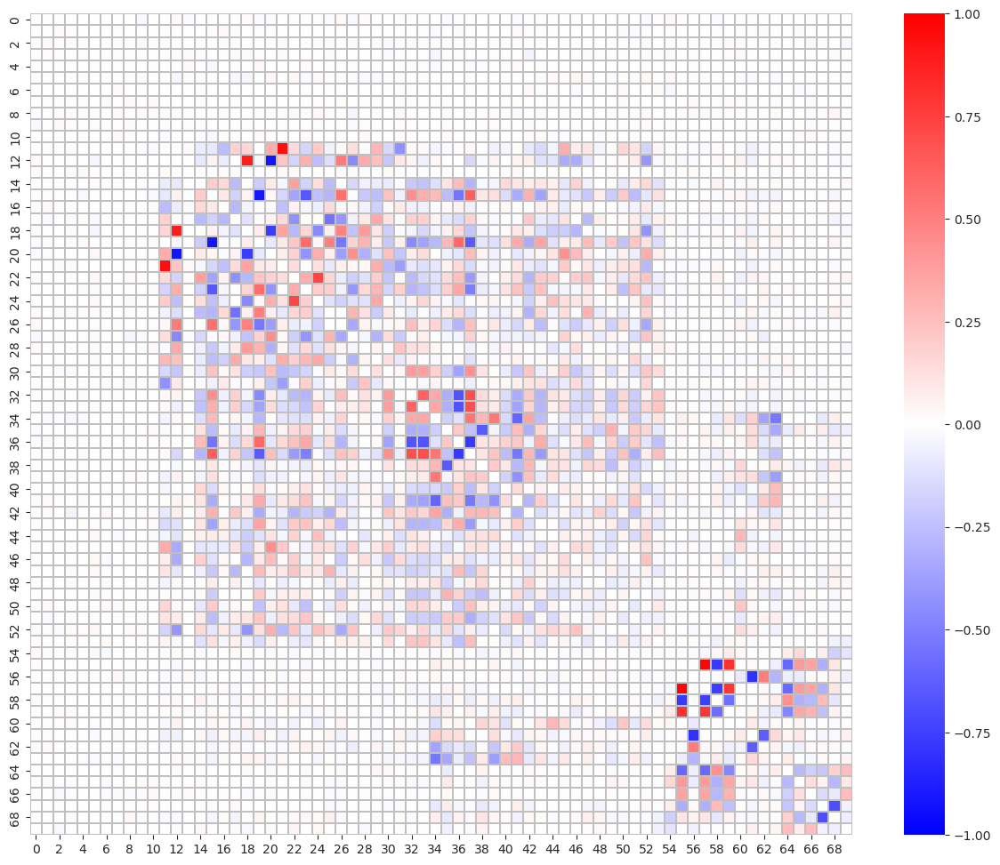

fig/regression

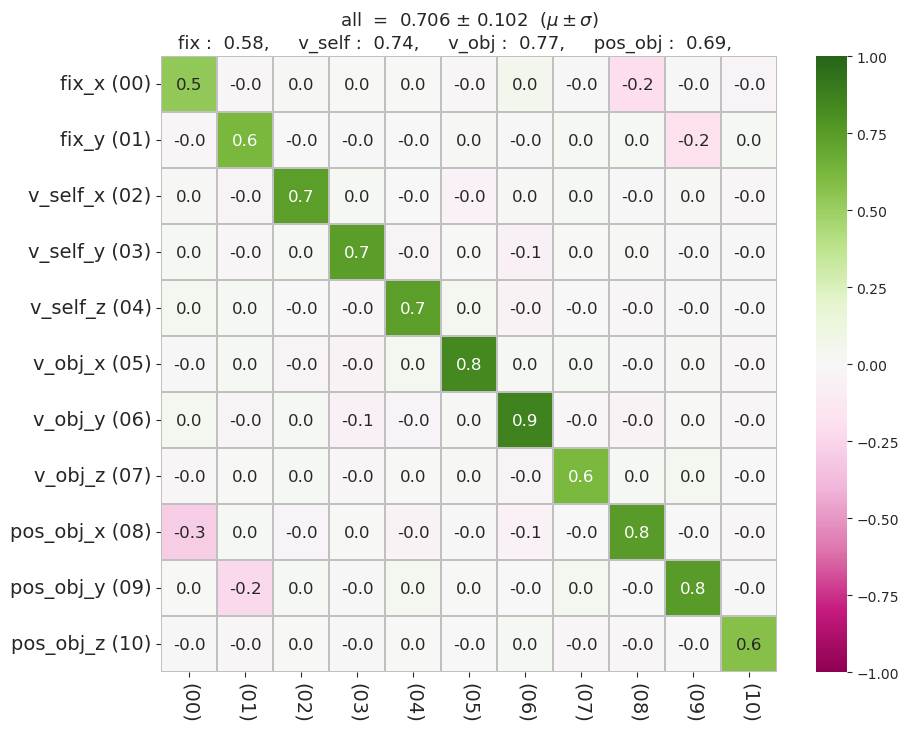

fig/mutual_info

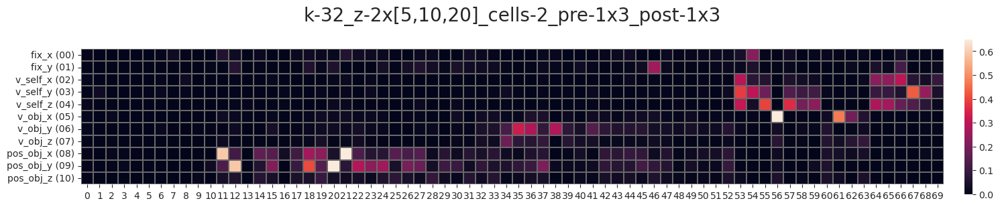

fig/hist_z

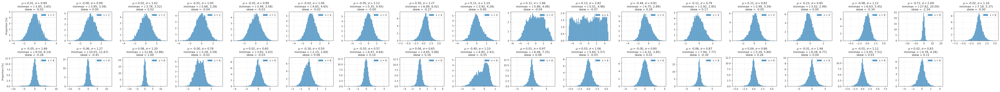

fig/hist_x_sample

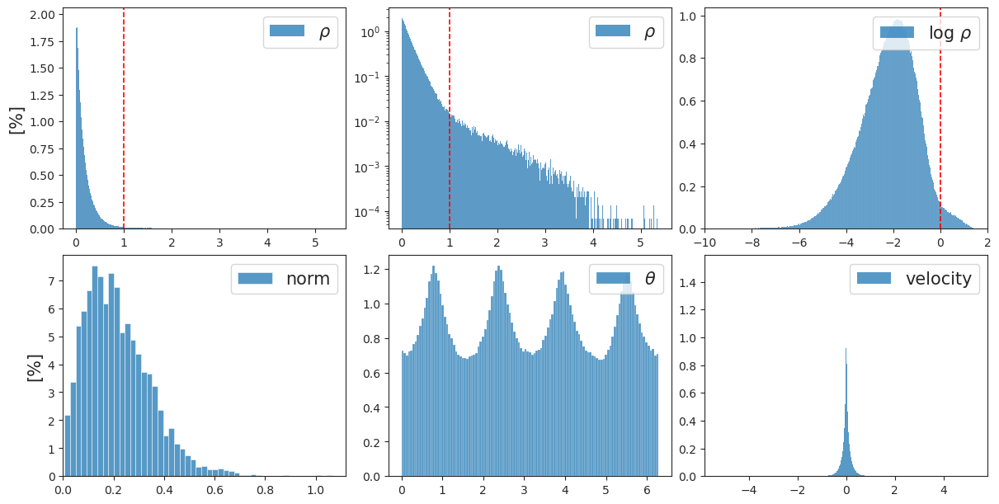

{'kl': 38.639343,
 'l1': 0.8588203,
 'l2': 0.41020775,
 'epe': 2.7099655,
 'cos': 4.7004614}

'k-32_z-3x[10,20]_cells-2_pre-1x3_post-1x3'

fig/sample

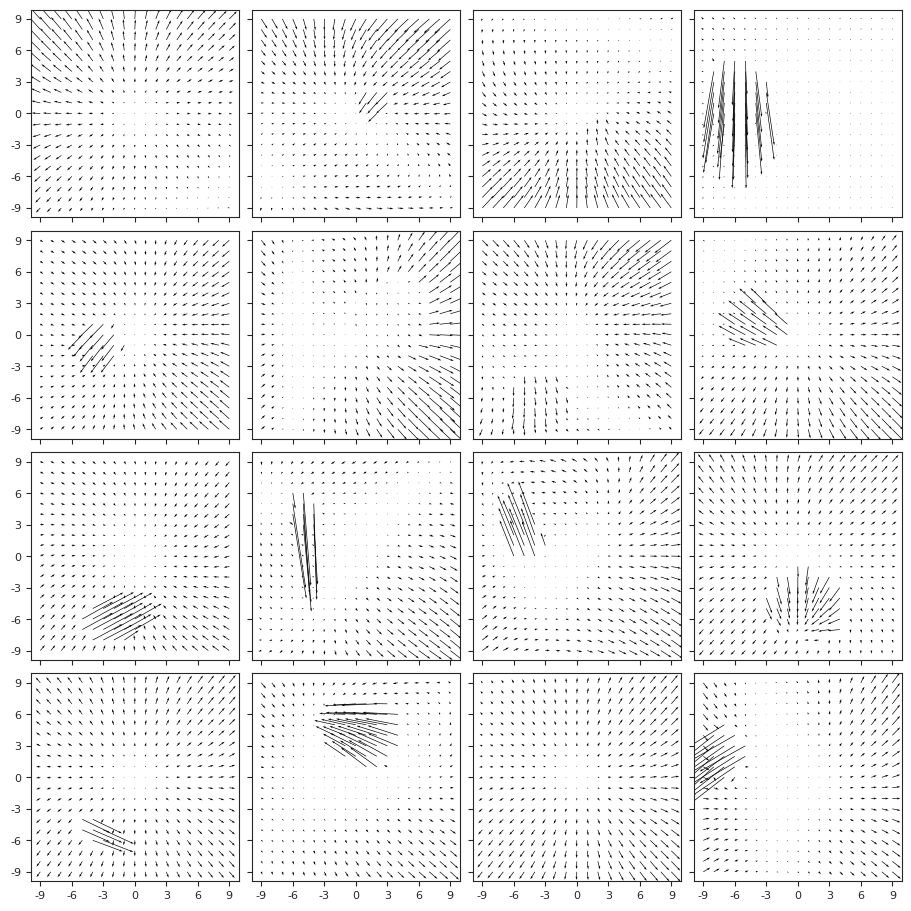

fig/corr_z

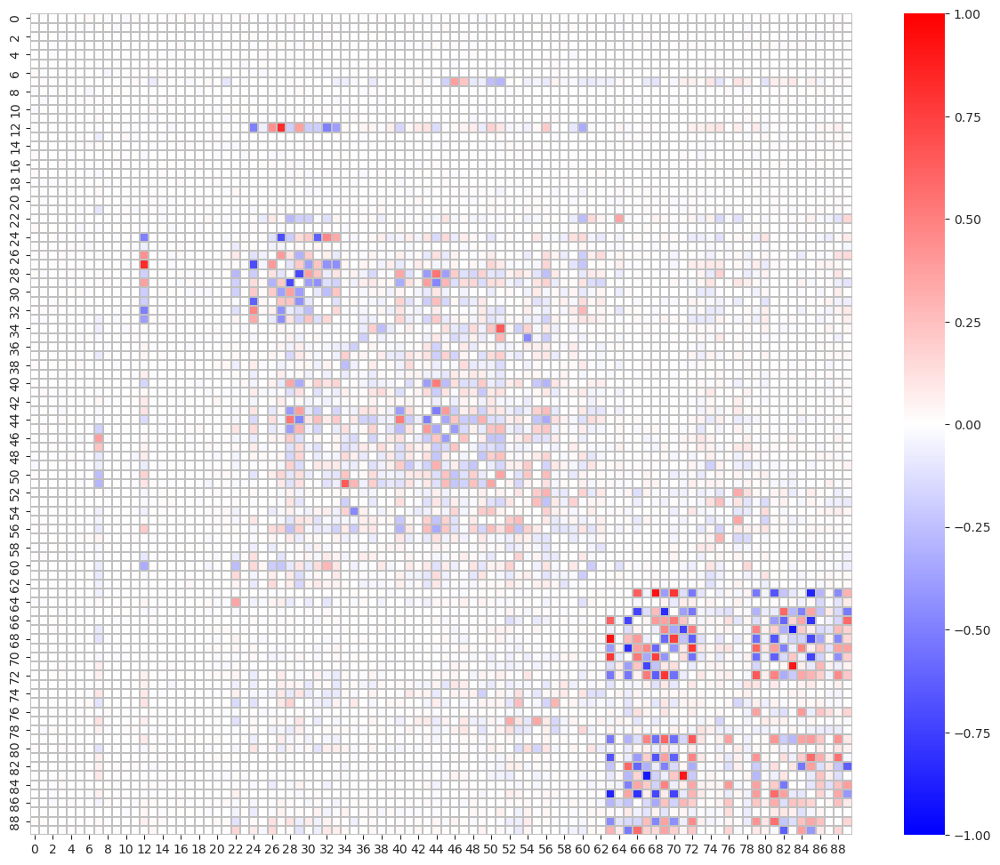

fig/regression

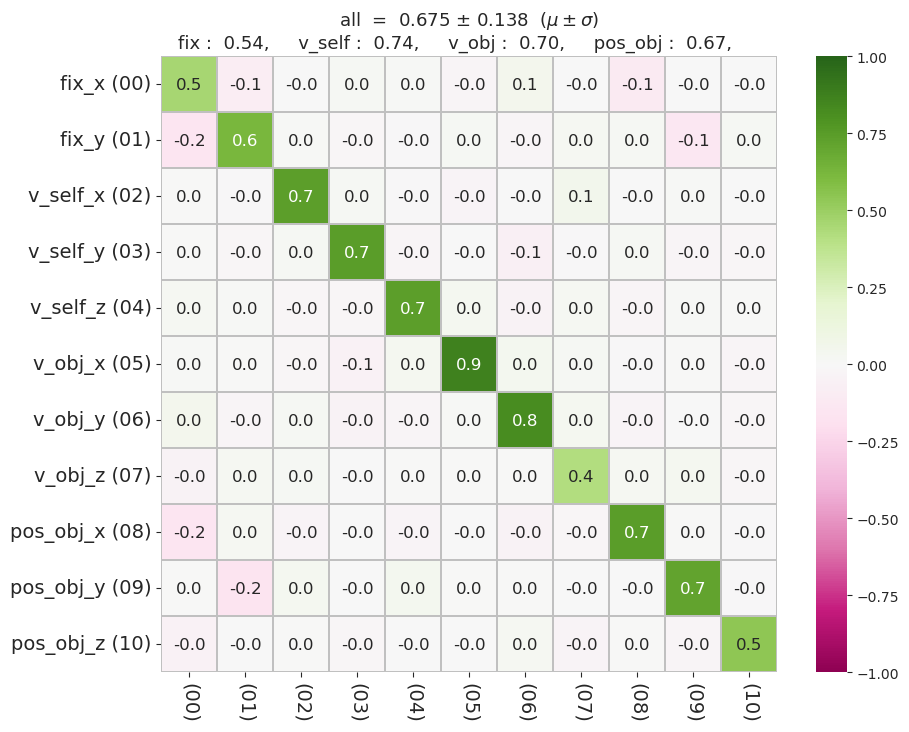

fig/mutual_info

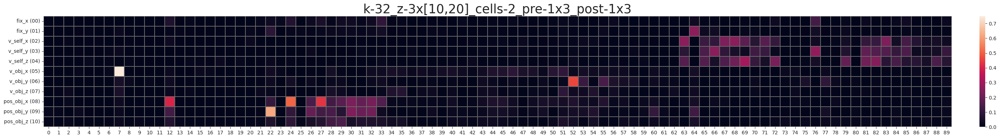

fig/hist_z

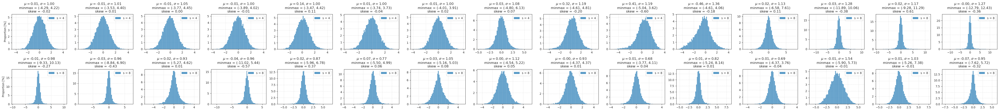

fig/hist_x_sample

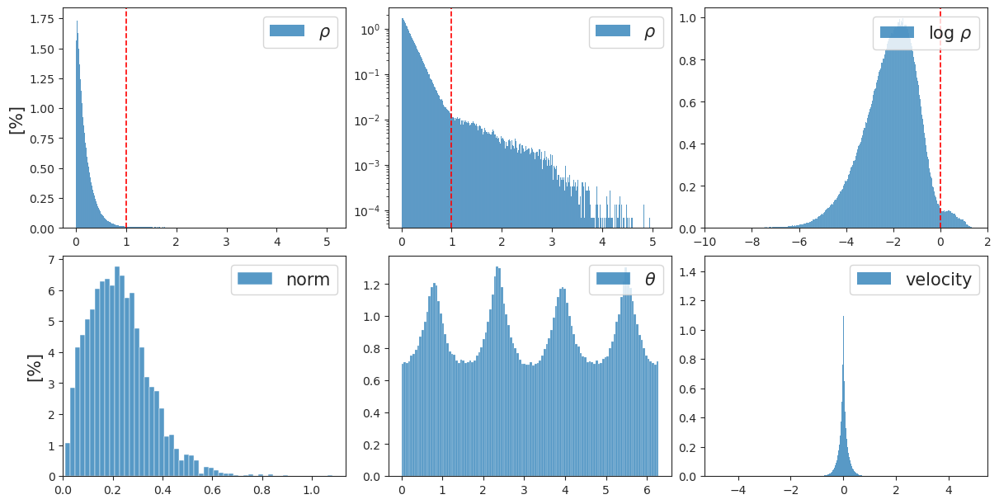

{'kl': 37.9371,
 'l1': 0.77506655,
 'l2': 0.33960417,
 'epe': 2.5864453,
 'cos': 4.4679103}

'k-32_z-3x[20,20]_cells-2_pre-1x3_post-1x3'

fig/sample

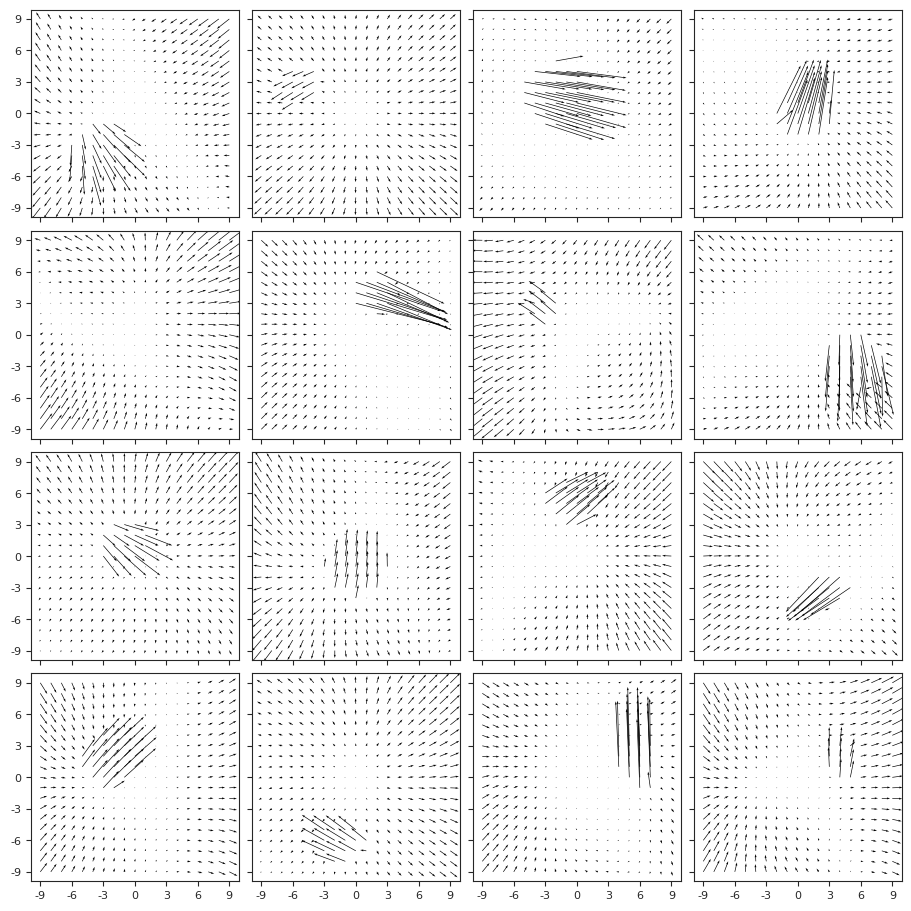

fig/corr_z

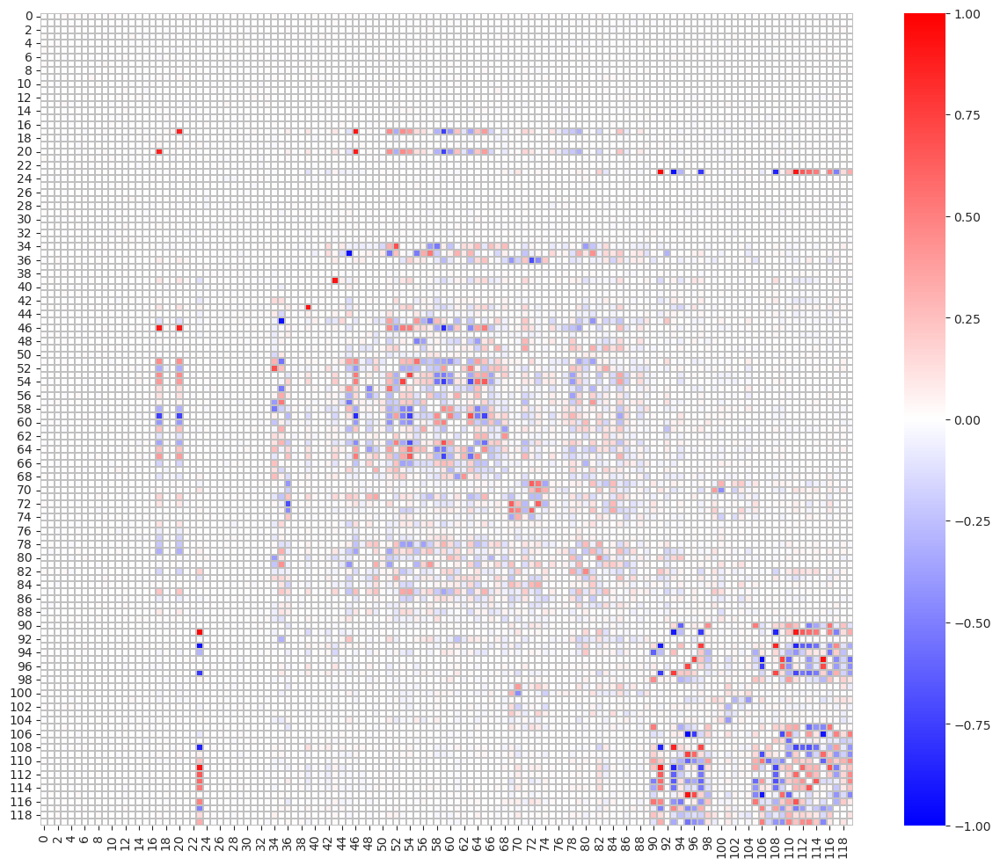

fig/regression

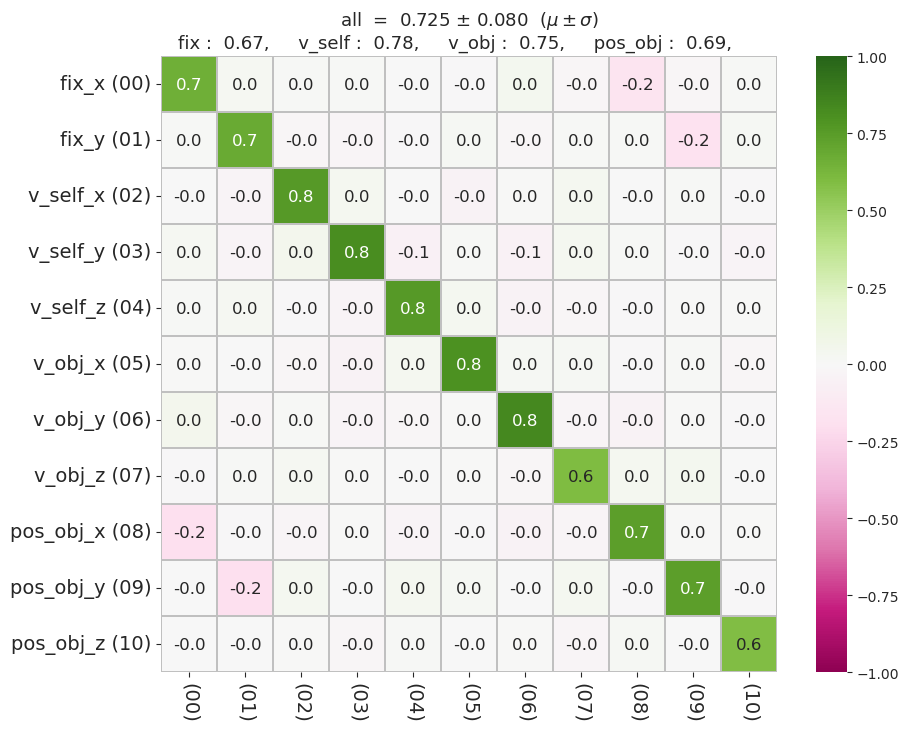

fig/mutual_info

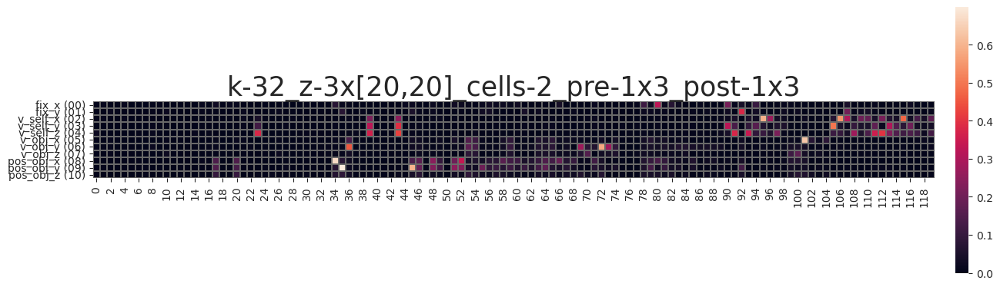

fig/hist_z

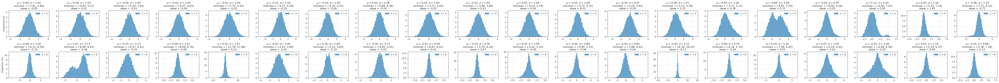

fig/hist_x_sample

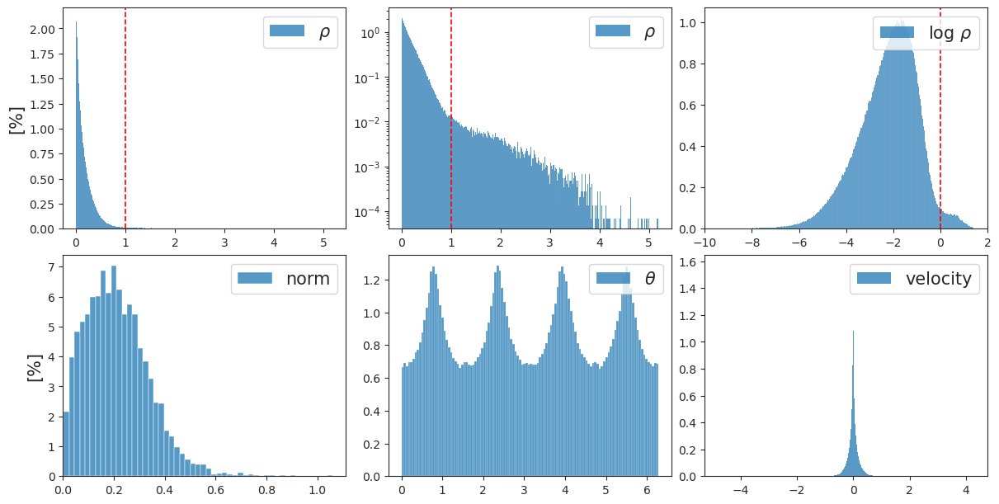

In [21]:
mi = val['regr/mi']
mi.shape

(11, 120)

In [22]:
scales, level_ids = vae.latent_scales()

In [24]:
mi_scales = np.zeros((len(mi), len(level_ids)))
for j, (key, ids) in enumerate(level_ids.items()):
    for i, x in enumerate(mi):
        mi_scales[i, j] = x[ids].sum() / x.sum()
mi_scales.shape

(11, 40)

In [27]:
names = tr.dl_tst.dataset.factor_names
_ty = [f"{e} ({i:02d})" for i, e in names.items()]
_tx = [e.split('_')[1] for e in level_ids]

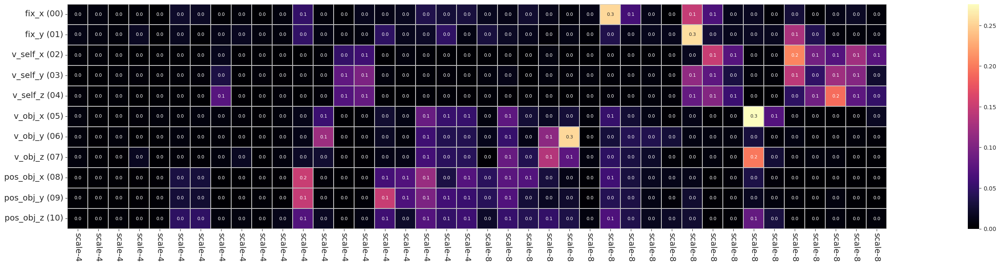

In [28]:
show_heatmap(
    r=mi_scales,
    vmin=0,
    vmax=None,
    yticklabels=_ty,
    xticklabels=_tx,
    cmap='magma',
    figsize=(50, 7),
);

In [29]:
mi_scales2 = np.zeros((len(mi), len(vae.cfg.groups)))
for j, s in enumerate(np.unique(scales)):
    _ids = []
    for k, ids in level_ids.items():
        if f'scale-{s}' in k:
            _ids.extend(list(ids))
    for i, x in enumerate(mi):
        mi_scales2[i, j] = x[_ids].sum() / x.sum()

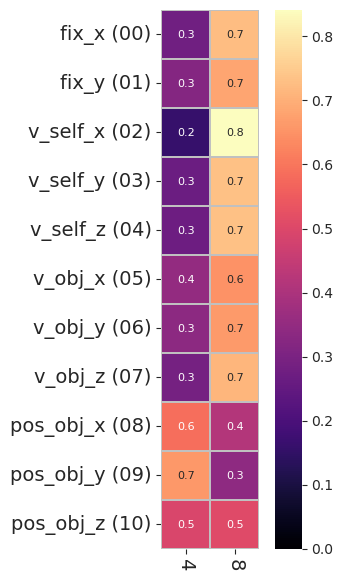

In [30]:
show_heatmap(
    r=mi_scales2,
    vmin=0,
    vmax=None,
    yticklabels=_ty,
    xticklabels=np.unique(scales),
    cmap='magma',
    figsize=(4, 7),
);

In [44]:
u, s, v = sp_lin.svd(val['z_vld'], full_matrices=False, compute_uv=True)
s *= 100 / s.sum()
u.shape, s.shape, v.shape

((7500, 120), (120,), (120, 120))

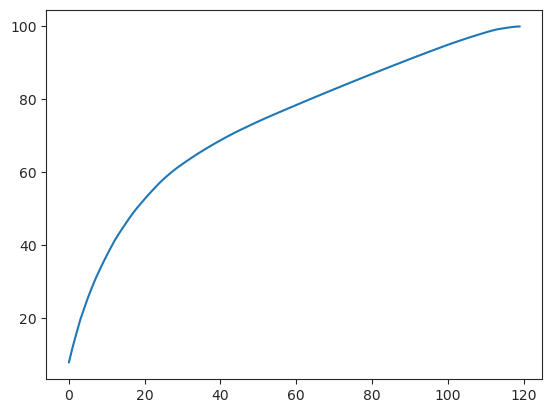

In [46]:
plt.plot(np.cumsum(s))

In [32]:
x, norm = next(iter(tr.dl_tst))
x, norm = tr.to([x, norm])
w = 1 / norm

In [33]:
tr.model.eval();
with torch.no_grad():
    y, *_ = tr.model(x)

In [34]:
l1 = tr.model.l1_recon(x, y)
l1 = torch.sum(l1, dim=[1, 2, 3])
l1_bal = l1 * w / w.mean()
l1_bal = to_np(l1_bal)
l1 = to_np(l1)
l1.shape

(512,)

In [35]:
np.argmax(l1)

70

In [36]:
np.argmax(l1_bal)

54

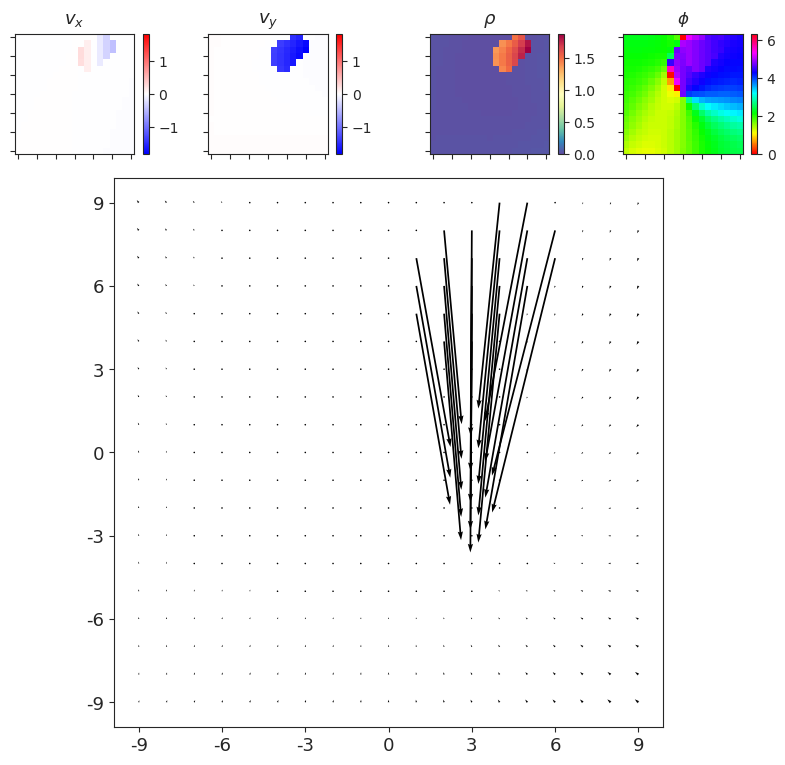

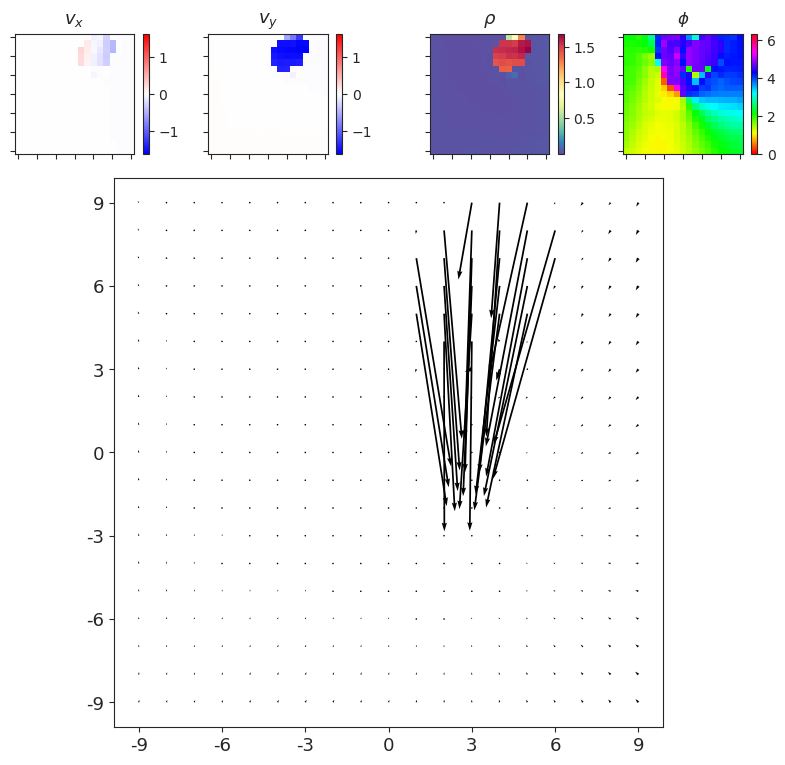

In [37]:
i = 54
show_opticflow_full(x[i])
show_opticflow_full(y[i]);

In [38]:
epe = endpoint_error(x, y)
epe_bal = epe * w / w.mean()
epe_bal = to_np(epe_bal)
np.argmax(epe_bal)

417

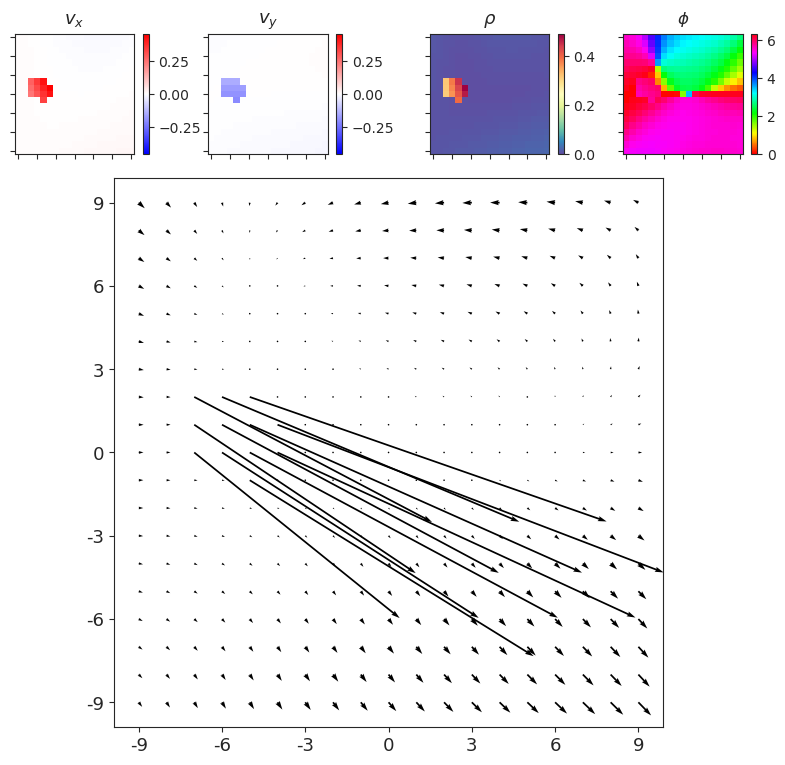

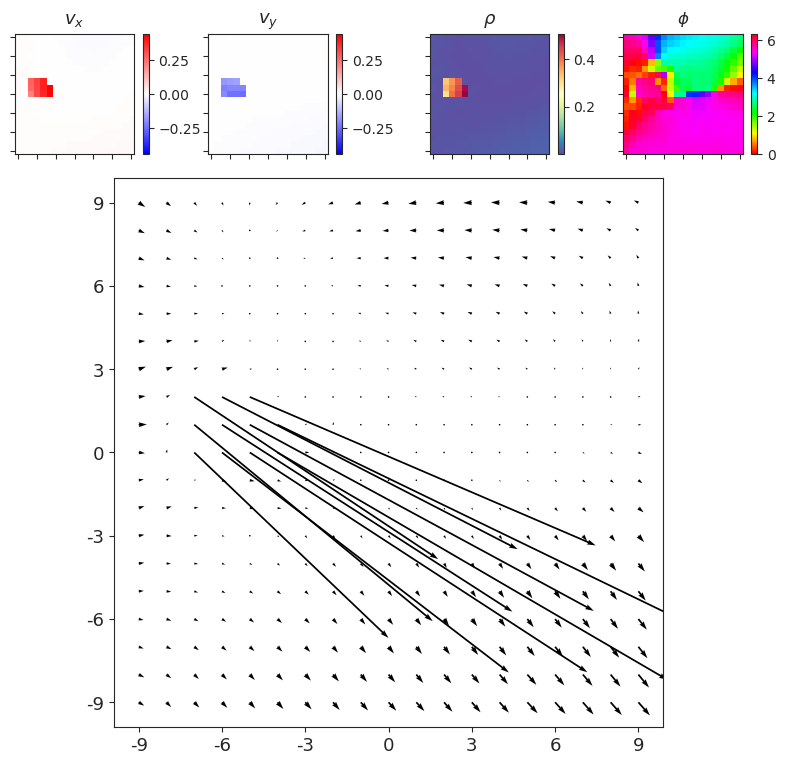

In [39]:
i = 417
show_opticflow_full(x[i])
show_opticflow_full(y[i]);

In [40]:
cos = 1 - tr.model.cos_recon(x, y)
cos = torch.sum(cos, dim=[1, 2])
cos = to_np(cos)

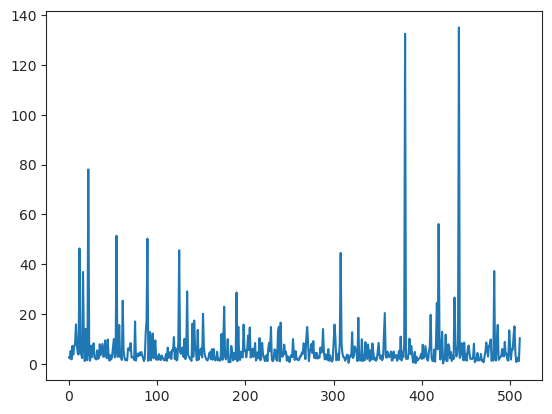

In [41]:
plt.plot(cos)

In [42]:
np.argmax(cos)

442

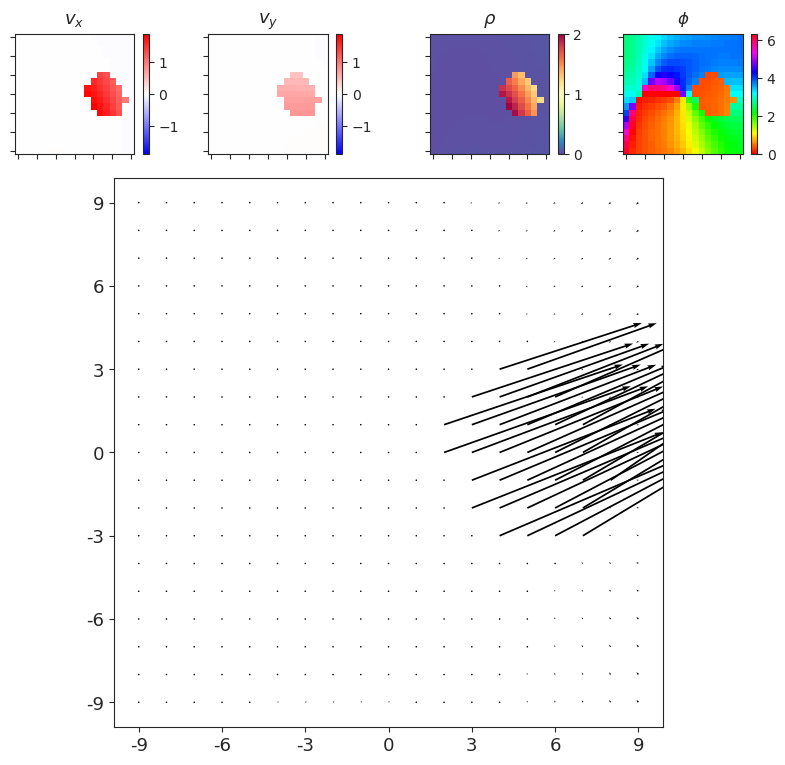

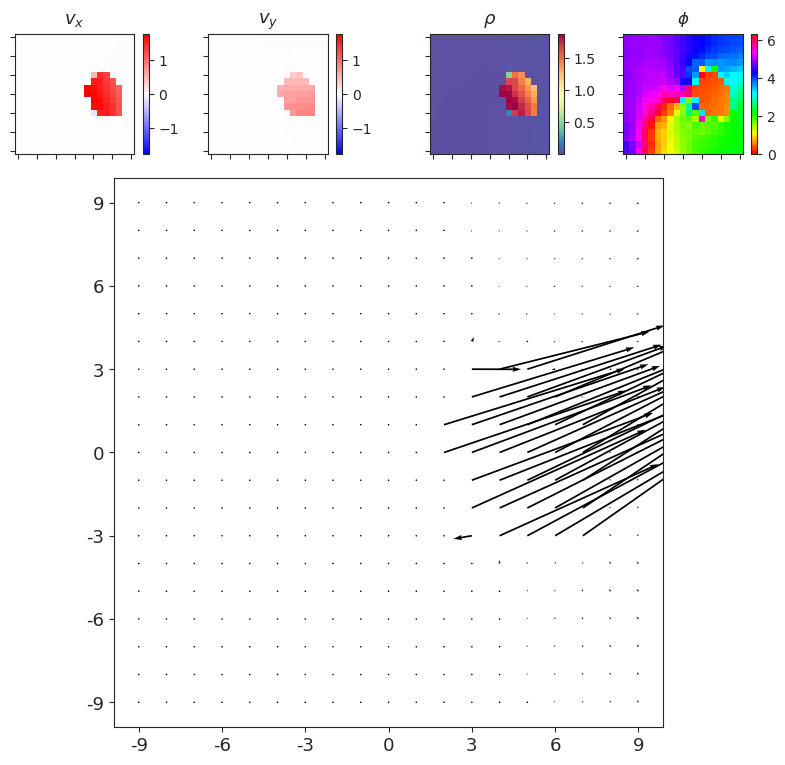

In [47]:
show_opticflow_full(x[442])
show_opticflow_full(y[442]);

In [48]:
l1_bal.sum(), epe_bal.sum(), cos.sum()

(509.73825, 1637.9862, 3108.1858)

In [49]:
l2_true = vae.l2_recon(x, y)
l2_true = torch.sum(l2_true, dim=[1, 2, 3])
l2_true = l2_true * w / w.mean()
l2_true = to_np(l2_true)

In [50]:
l2_true.sum()

213.72304

In [51]:
np.argmax(l2_true)

54

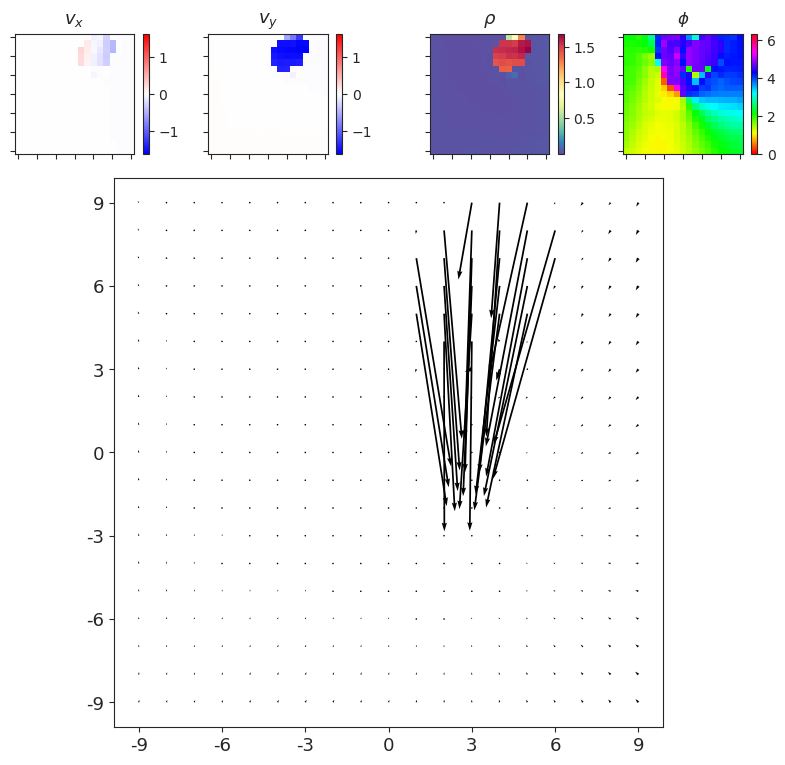

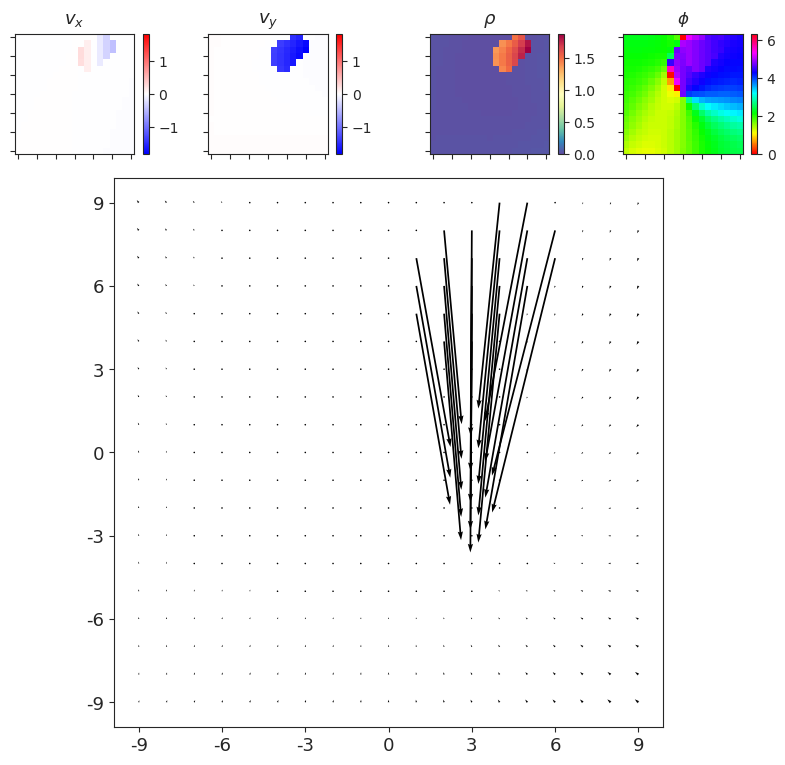

In [52]:
show_opticflow_full(y[54])
show_opticflow_full(x[54]);

In [53]:
np.argsort(epe_bal)[:5]

array([225, 191, 222,  30, 272])

In [55]:
epe_bal[225], epe[225]

(1.0957534, tensor(2.8871, device='cuda:0'))

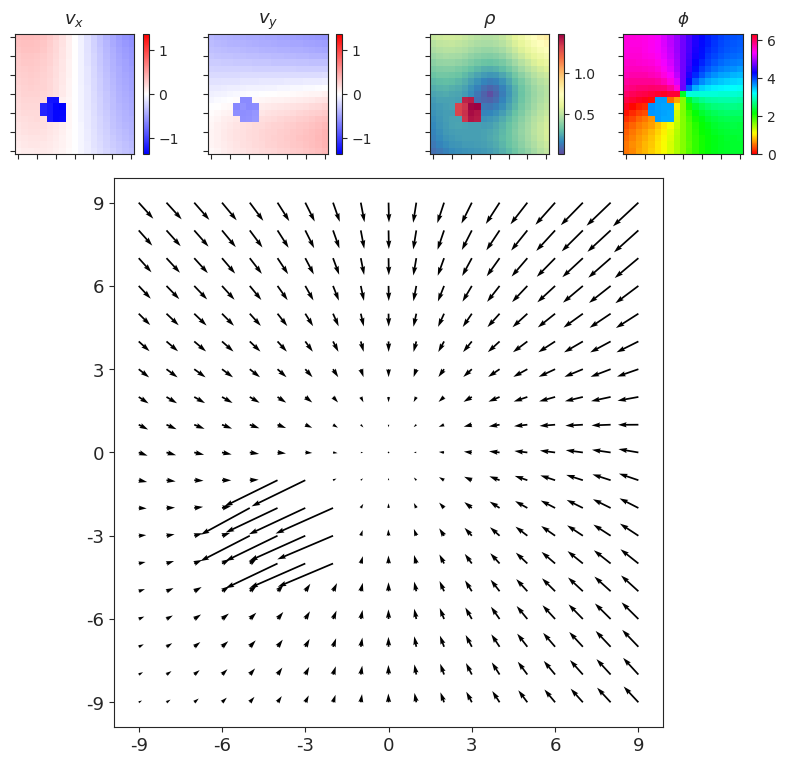

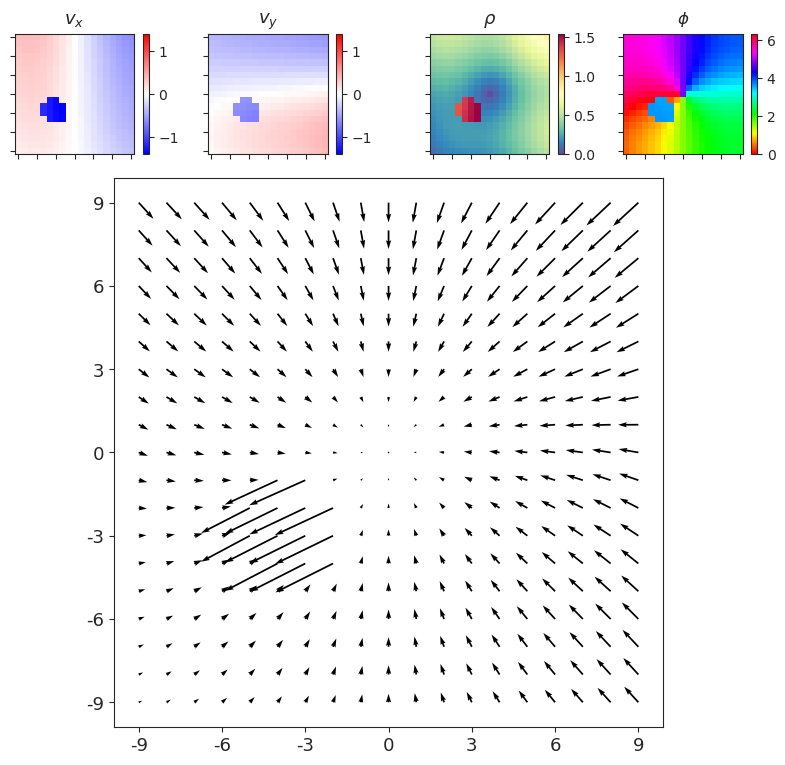

In [56]:
show_opticflow_full(y[225])
show_opticflow_full(x[225]);

In [57]:
np.argsort(epe_bal)[-1]

417

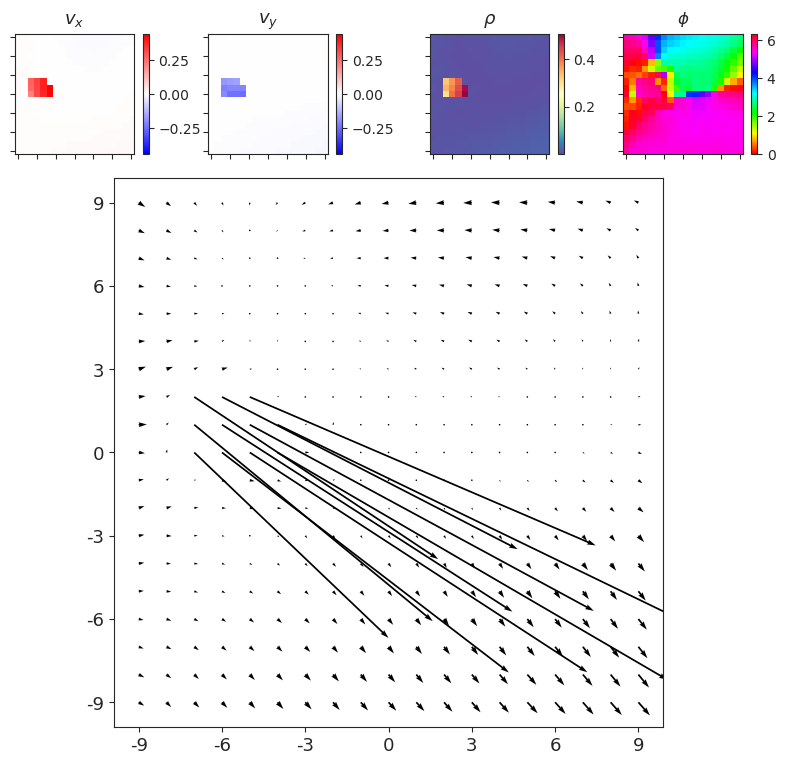

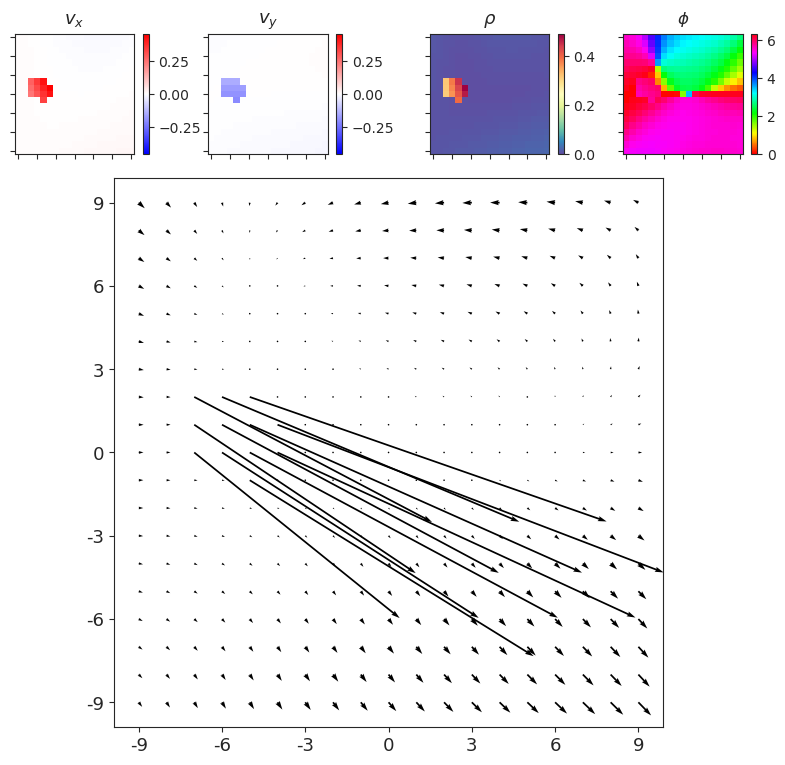

In [59]:
show_opticflow_full(y[417])
show_opticflow_full(x[417]);

In [43]:
torch.linalg.norm(vae.expand[3].weight)

tensor(0., device='cuda:0', grad_fn=<LinalgVectorNormBackward0>)

In [39]:
w2p = {}
norms_expand = {}
for i, layer in enumerate(vae.expand):
    w2p[i] = to_np(layer.weight)
    _norm = to_np(torch.linalg.norm(layer.weight, dim=1).sum())
    norms_expand[i] = _norm
print({i: np.round(v, 3) for i, v in norms_expand.items()})

{
    0: 0.0,
    1: 0.0,
    2: 0.0,
    3: 0.0,
    4: 0.0,
    5: 2.991,
    6: 2.633,
    7: 2.454,
    8: 0.076,
    9: 0.218,
    10: 0.27,
    11: 11.529,
    12: 5.169,
    13: 4.488,
    14: 4.657,
    15: 8.618,
    16: 12.263,
    17: 9.225,
    18: 10.463,
    19: 15.844,
    20: 39.484,
    21: 24.393,
    22: 22.504,
    23: 34.079,
    24: 25.439,
    25: 1.808,
    26: 21.293,
    27: 17.608,
    28: 20.081,
    29: 25.538,
    30: 40.797,
    31: 31.859,
    32: 24.752,
    33: 32.504,
    34: 29.904,
    35: 54.777,
    36: 32.537,
    37: 46.87,
    38: 28.224,
    39: 27.703
}

In [ ]:
scales, _ = tr.model.latent_scales()
num = vae.cfg.n_latent_per_group

for i, _w in w2p.items():
    fig, axes = create_figure(num, num, (6, 6), 'all', 'all', tight_layout=True)
    for z, k in itertools.product(range(num), range(num)):
        ax = axes[z, k]
        im = ax.imshow(_w[z, k])
        plt.colorbar(im, ax=ax)
        if z == 0:
            ax.set_title(f"k = {k}", fontsize=13)
        if k == 0:
            ax.set_ylabel(f"z = {z}", fontsize=13)
    fig.suptitle(f'Expand_{i} (scale = {scales[i]})', fontsize=15, y=1.02)
    plt.show()

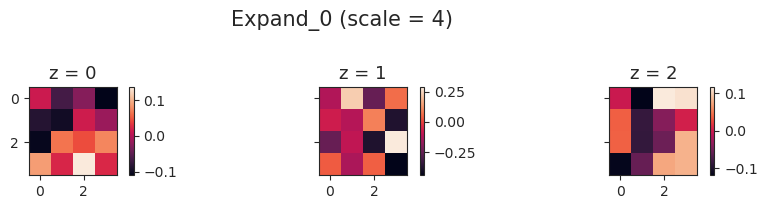

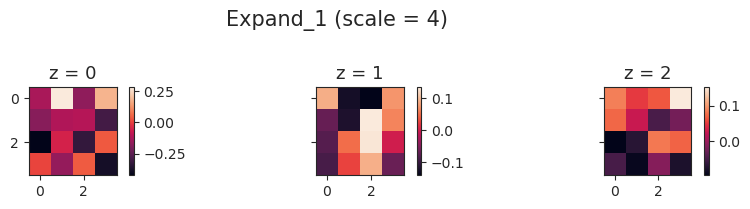

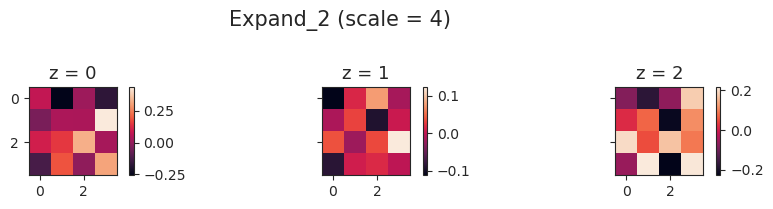

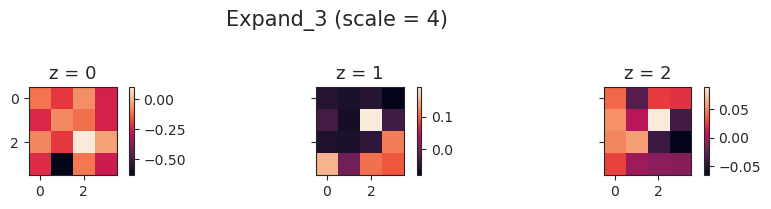

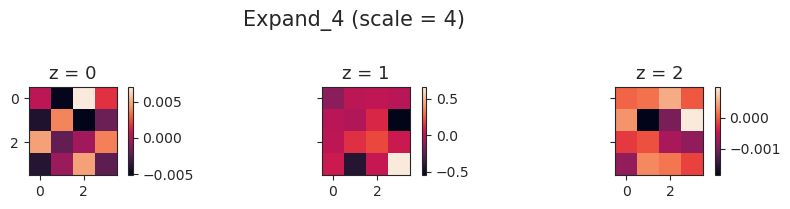

...

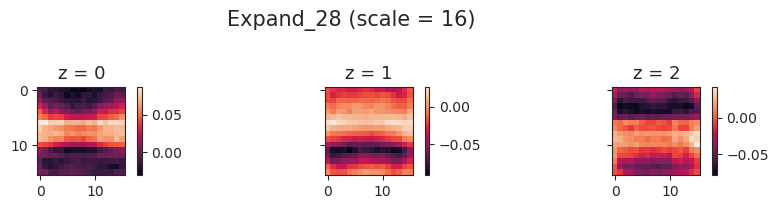

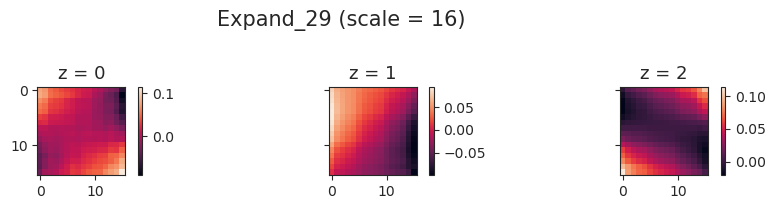

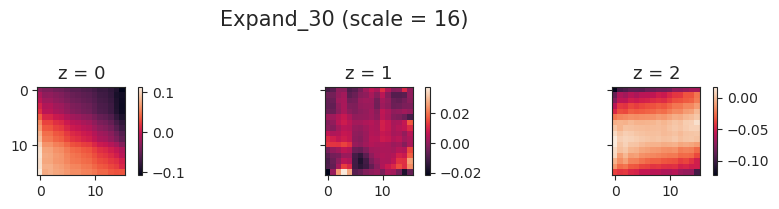

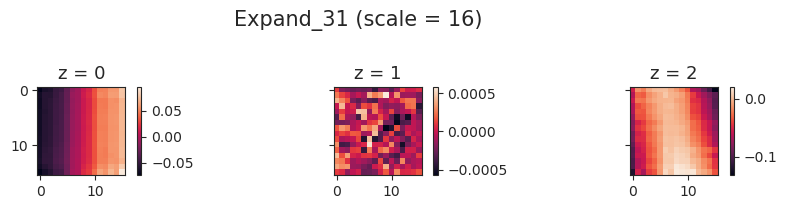

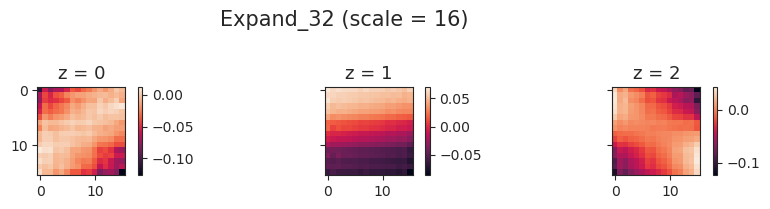

In [66]:
scales, _ = tr.model.latent_scales()
num = vae.cfg.n_latent_per_group

for i, _w in w2p.items():
    fig, axes = create_figure(1, num, (9, 2), 'all', 'all', tight_layout=True)
    for z in range(num):
        ax = axes[z]
        im = ax.imshow(_w[z, 0])
        plt.colorbar(im, ax=ax)
        ax.set_title(f"z = {z}", fontsize=13)
    fig.suptitle(f'Expand_{i} (scale = {scales[i]})', fontsize=15, y=1.02)
    plt.show()

NameError: name 'w2p' is not defined

In [78]:
val['regr/mi'].shape

(11, 140)

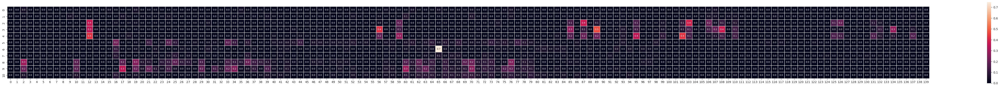

In [82]:
_ = show_heatmap(val['regr/mi'], vmin=0, vmax=None, cmap='rocket', figsize=(70, 5))

In [89]:
from sklearn.feature_selection import mutual_info_regression

In [92]:
z = val['z_vld'][:, 12]
g = val['g_vld']

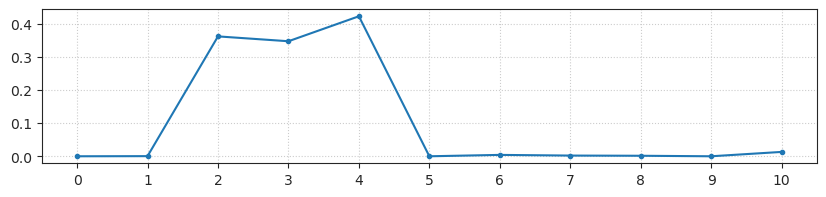

In [97]:
fig, ax = create_figure(figsize=(10, 2))
ax.plot(mutual_info_regression(g, z), marker='.')
ax.set_xticks(range(11))
ax.grid()

In [106]:
v_slf = g[:, 2:5]
v_slf = cart2polar(v_slf)
v_slf.shape

(7500, 3)

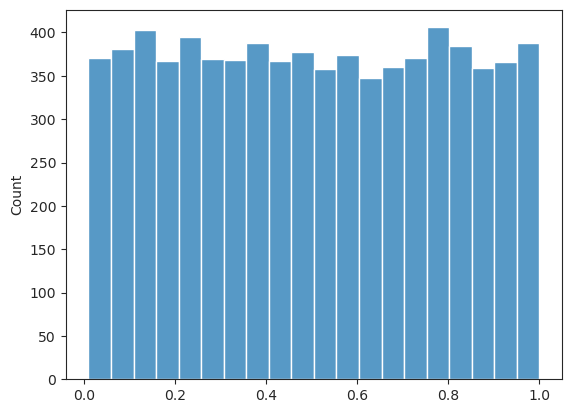

In [109]:
sns.histplot(v_slf[:, 0]);

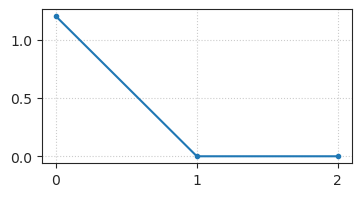

In [110]:
fig, ax = create_figure(figsize=(4, 2))
ax.plot(mutual_info_regression(v_slf, z), marker='.')
ax.set_xticks(range(3))
ax.grid()

In [111]:
vae.cfg.n_latent_per_group

20

## Best fit

In [16]:
val, loss = tr.validate(n_samples=4096)
{k: v.mean() for k, v in loss.items()}

{'kl': 78.1286, 'recon': 1.3715392, 'recon_balanced': 0.8656474}

fig/sample

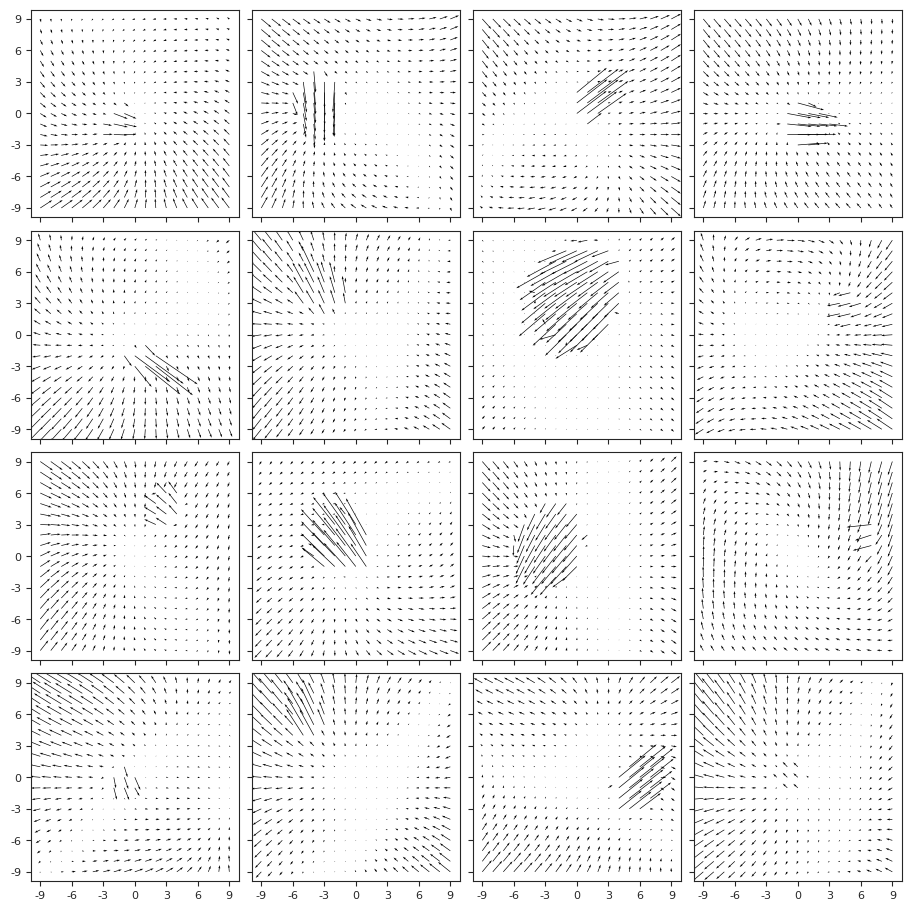

fig/corr_z

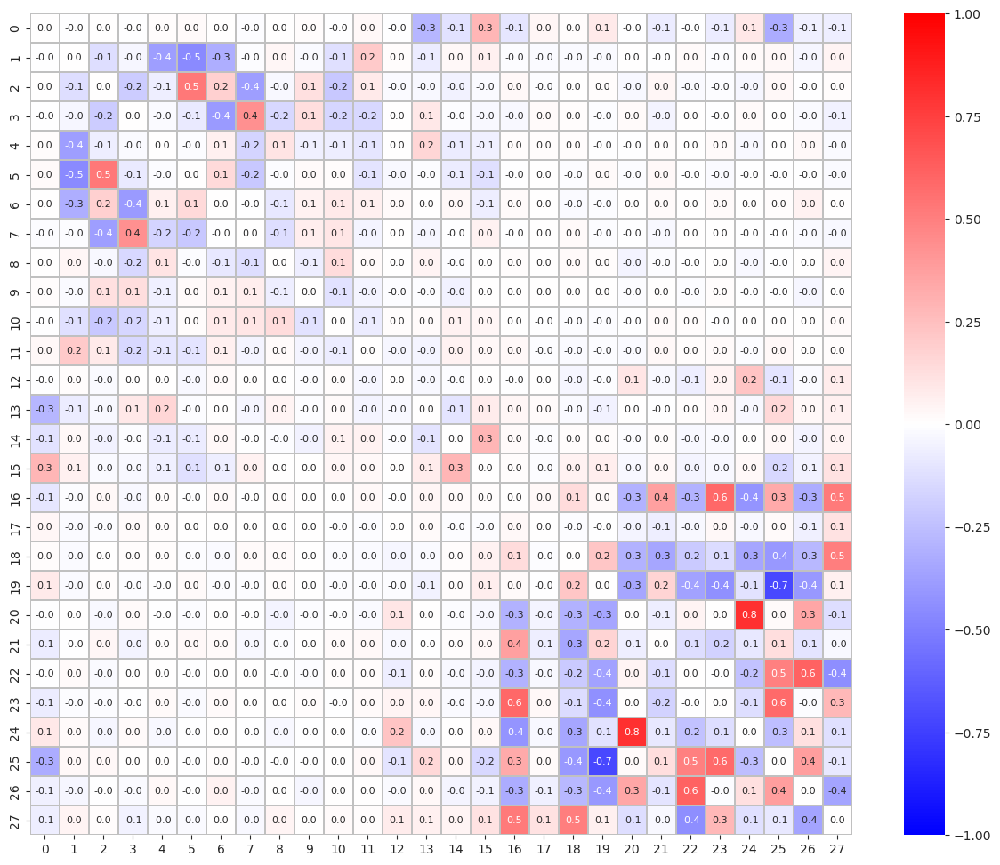

fig/regression

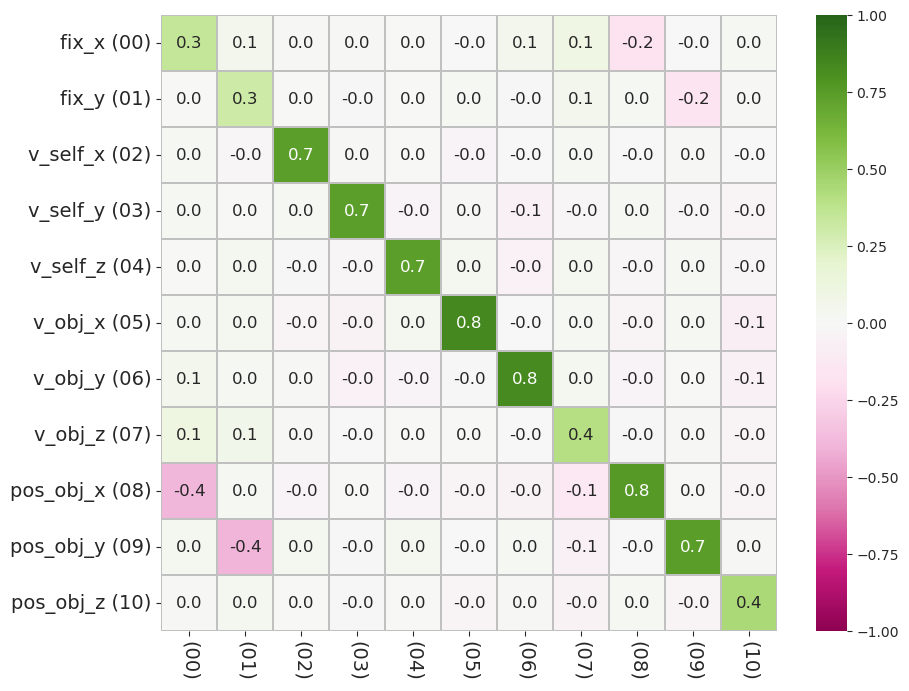

fig/mutual_info

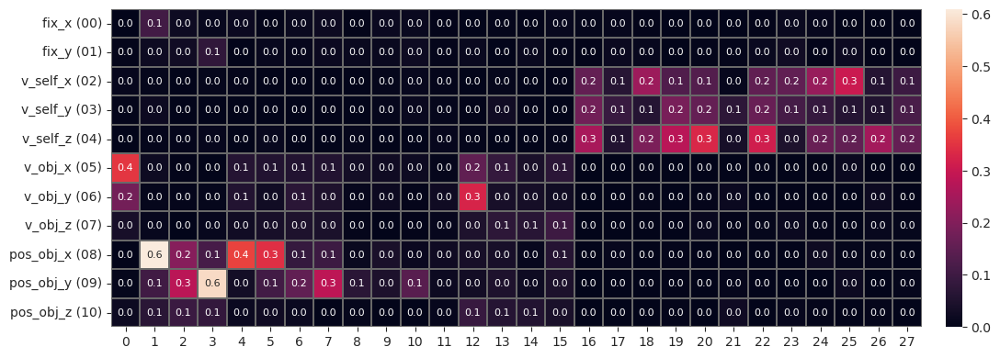

fig/hist_z

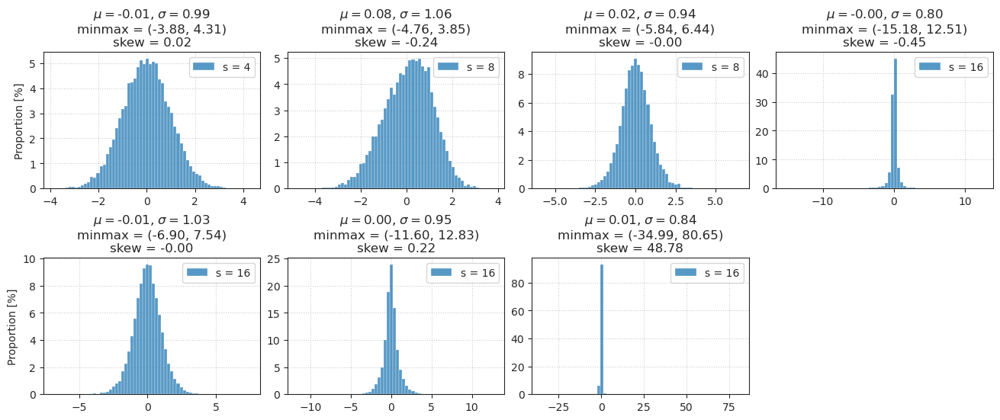

fig/hist_x_sample

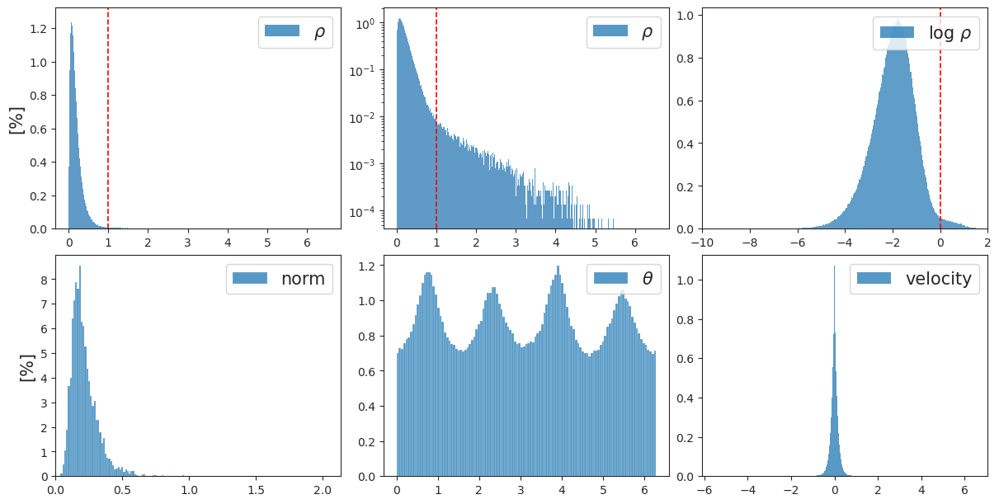

In [19]:
for k, v in val.items():
    if 'fig' in k:
        print(k)
        display(v)

In [20]:
print(vae)

VAE(
  (stem): ParametrizedConv2D(
    2, 32, kernel_size=(4, 4), stride=(1, 1), padding=valid
    (parametrizations): ModuleDict(
      (weight): ParametrizationList(
        (0): _SpectralNorm()
      )
    )
  )
  (pre): ModuleList()
  (enc_tower): ModuleList(
    (0): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
      )
      (se): SELayer(
        (pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=32, out_features=4, bias=True)
          (1): SiLU()
          (2): Linear(in_features=4, out_features=32, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (1): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
      )
      (se): SELayer(
        (pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=32, out_features=4, bias=True)
          (1): SiLU()
          (2): Linear(in_features=4, out_features=32, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (2): CombinerEnc(
      (conv): ParametrizedConv2D(
        32, 32, kernel_size=(1, 1), stride=(1, 1)
        (parametrizations): ModuleDict(
          (weight): ParametrizationList(
            (0): _SpectralNorm()
          )
        )
      )
    )
    (3): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm()
              )
            )
          )
        )
      )
      (se): SELayer(
        (pool): AdaptiveAvgPool2d(output_size=1)
        (fc): Sequential(
          (0): Linear(in_features=32, out_features=4, bias=True)
          (1): SiLU()
          (2): Linear(in_features=4, out_features=32, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (4): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): ParametrizedConv2D(
            32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)
            (parametrizations): ModuleDict(
              (weight): ParametrizationList(
                (0): _SpectralNorm(

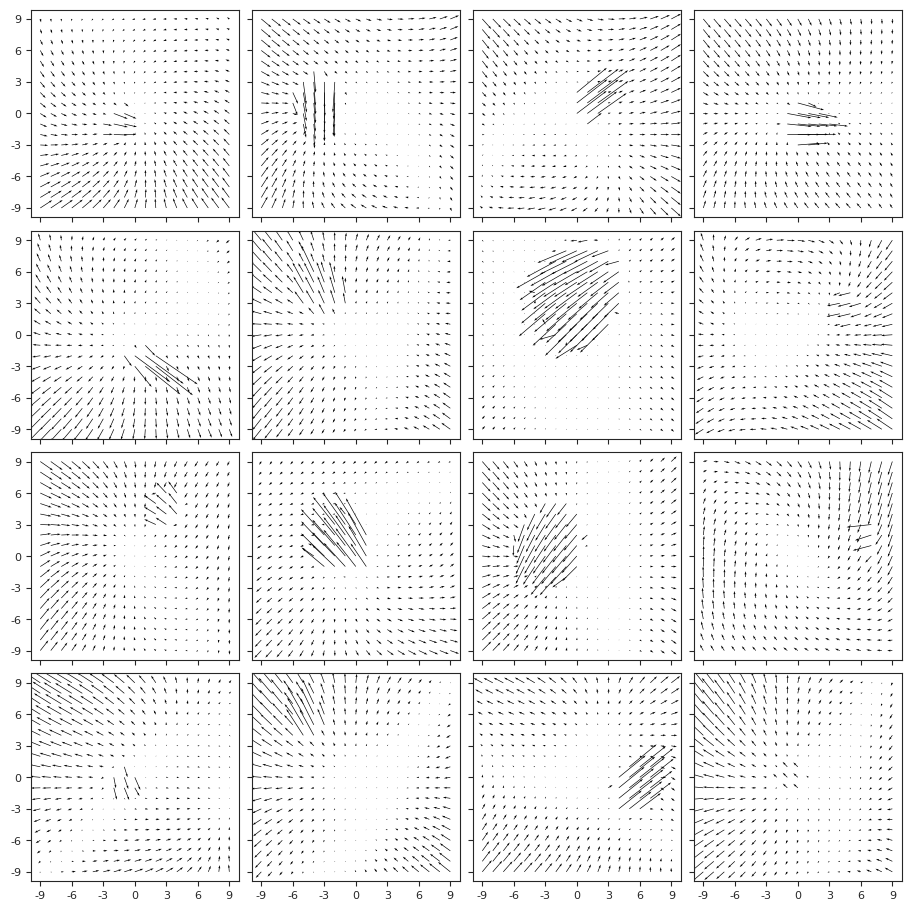

In [21]:
_ = show_opticflow(val['x_sample'])

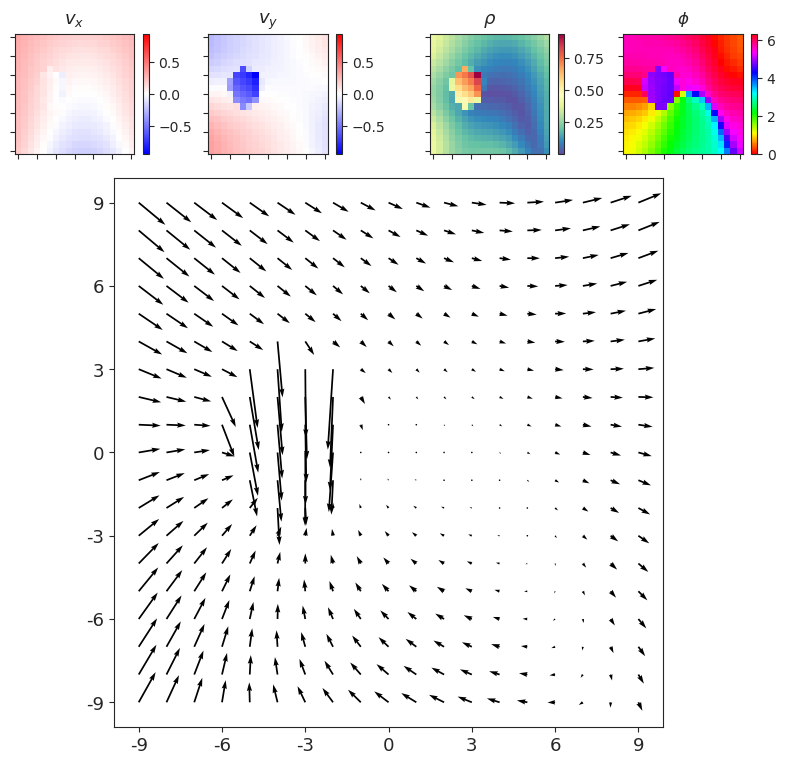

In [22]:
_ = show_opticflow_full(val['x_sample'][1])

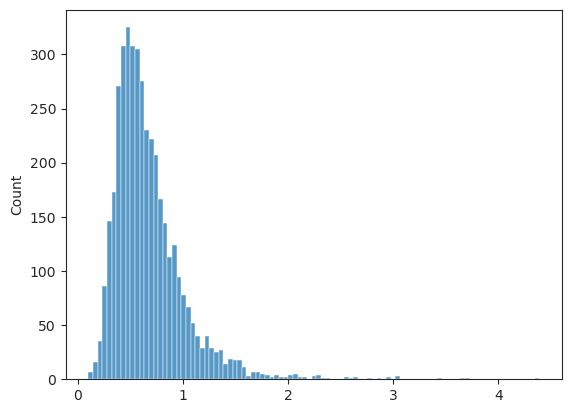

In [22]:
norm = sp_lin.norm(val['y_sample'], axis=-1).mean(-1).mean(-1)
sns.histplot(norm);

In [23]:
len(vae.all_conv_layers), len(vae.all_log_norm)

(94, 94)

In [24]:
collections.Counter([e.size()[0] for e in vae.all_log_norm]).most_common()

[(32, 47), (64, 24), (16, 8), (128, 8), (1, 7)]

In [25]:
(vae.stem.log_weight_norm.exp())

tensor([ 1.0003,  1.0001,  8.3582, 15.3836, 19.4694, 57.7580,  8.8898, 19.0314,
        21.5733, 11.6605,  6.8867, 20.2430, 10.6810,  2.6063, 55.4804, 16.1139,
        19.4010,  6.7875, 25.8128, 12.0472,  9.4975,  1.8904, 54.7517,  1.0000,
        33.3273,  0.4598,  2.4408,  1.6600, 22.2970,  0.8003,  1.5557, 26.3590],
       device='cuda:0', grad_fn=<ExpBackward0>)

In [26]:
to_np(torch.linalg.vector_norm(vae.stem.weight, dim=[1, 2, 3]))

array([0.09915974, 0.07353112, 0.34580144, 0.46537644, 0.34919724,
       0.55790186, 0.3663197 , 0.30363467, 0.40527374, 0.23678696,
       0.38394547, 0.48038718, 0.65771294, 0.24927707, 0.5576934 ,
       0.30126494, 0.64648294, 0.24343646, 0.5646717 , 0.27227154,
       0.39209002, 0.1871767 , 0.59206593, 0.10057449, 0.49123752,
       0.10552985, 0.32531214, 0.23663972, 0.694065  , 0.08851026,
       0.16330333, 0.49779817], dtype=float32)

In [27]:
w = to_np(vae.stem.weight)
w.shape

(32, 2, 4, 4)

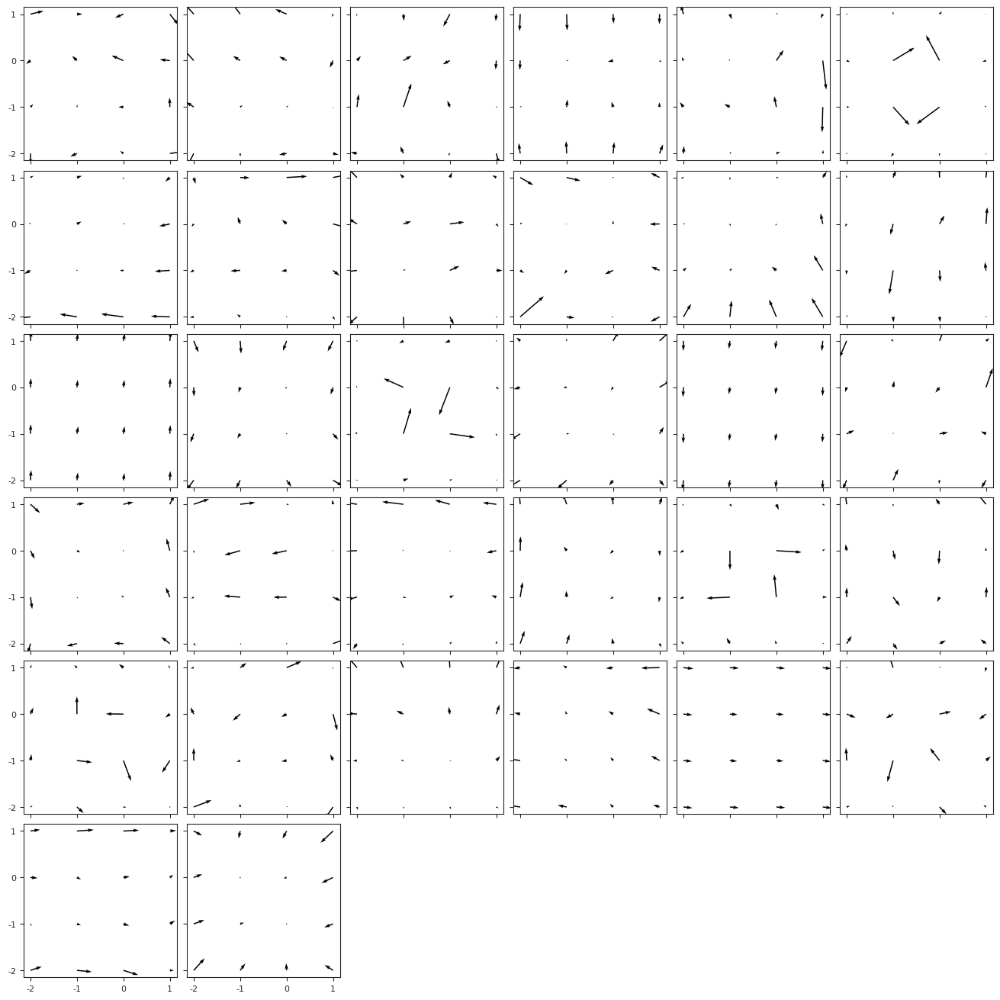

In [28]:
_ = show_opticflow(w, 6, figsize=(13, 13), tick_spacing=1)

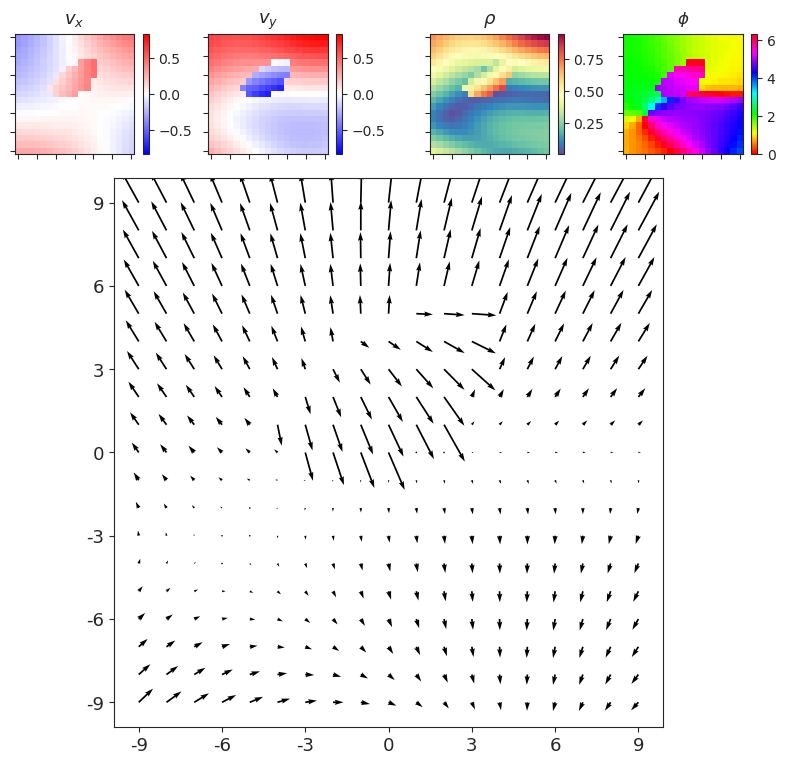

In [56]:
_ = show_opticflow_full(val['y_sample'][1311])

In [58]:
from figures.fighelper import *

In [76]:
scales = vae.latent_scales()

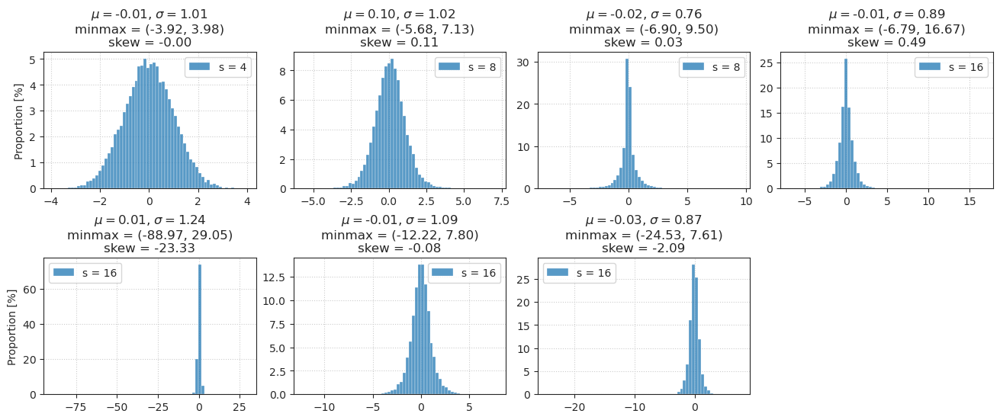

In [77]:
plot_latents_hist(val['z_sample'], scales);

In [60]:
i, zz = np.unravel_index(np.argmin(val['z_sample']), val['z_sample'].shape)
i, zz

(3550, 19)

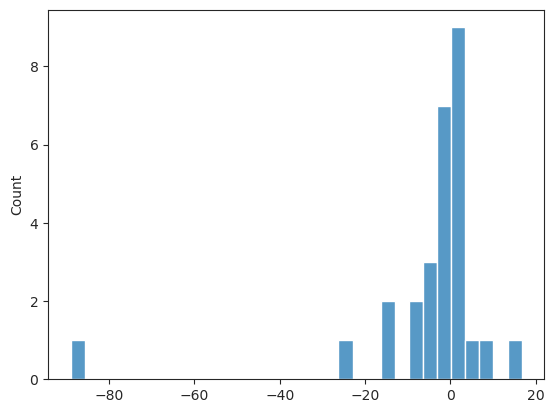

In [61]:
sns.histplot(val['z_sample'][i]);

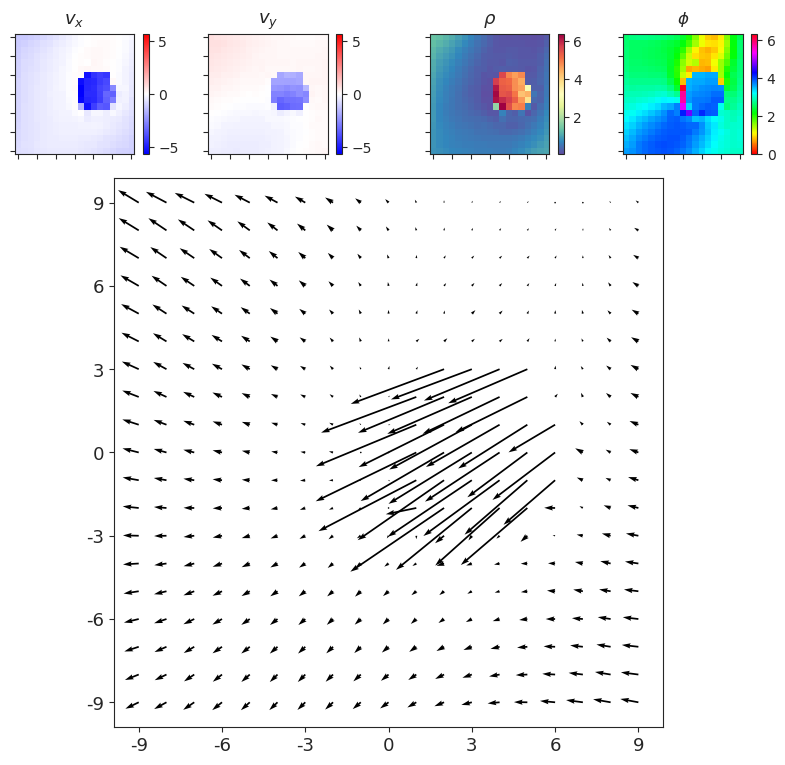

In [62]:
show_opticflow_full(val['y_sample'][i]);

In [63]:
i, zz = np.unravel_index(np.argmax(val['z_sample']), val['z_sample'].shape)
i, zz

(3468, 19)

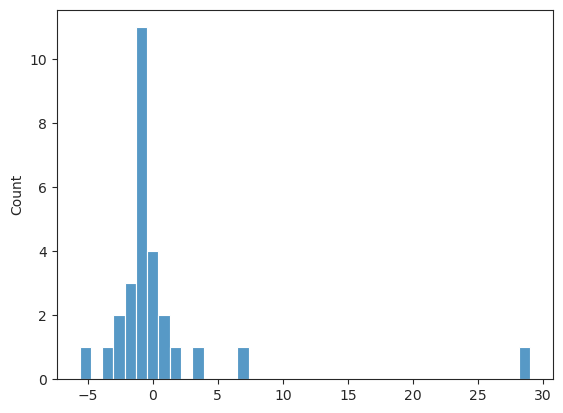

In [64]:
sns.histplot(val['z_sample'][i]);

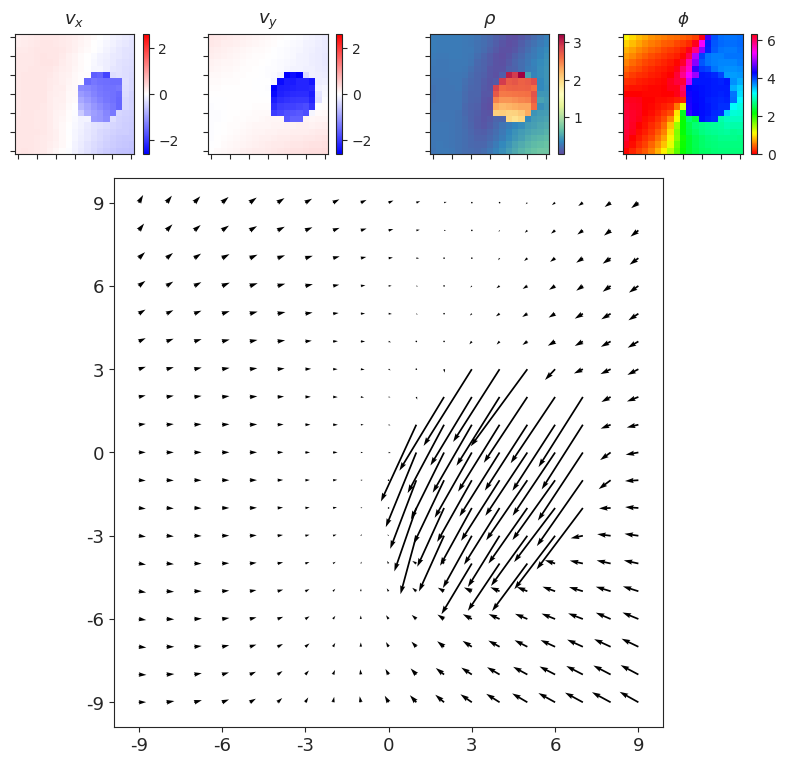

In [65]:
show_opticflow_full(val['y_sample'][i]);

In [66]:
all_norms = to_np(torch.cat(vae.all_log_norm).exp())

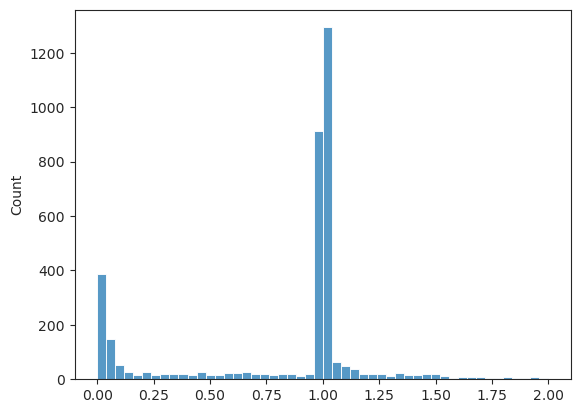

In [67]:
ax = sns.histplot(all_norms, bins=np.linspace(0, 2, 51));

In [68]:
np.max(all_norms)

434.6152

In [69]:
print(f"{np.round((all_norms > 5).sum() / len(all_norms) * 100, 1)} % of them are greated than 5")

9.7 % of them are greated than 5

In [19]:
w2p = {}
norms_expand = {}
for i, layer in enumerate(vae.expand):
    w2p[i] = to_np(layer.weight)
    _norm = to_np(torch.linalg.norm(layer.weight, dim=1).sum())
    norms_expand[i] = _norm
print({i: np.round(v, 3) for i, v in norms_expand.items()})

{0: 2.947, 1: 9.796, 2: 11.091, 3: 18.583, 4: 18.187, 5: 18.965, 6: 26.504}

In [21]:
scales = tr.model.latent_scales()

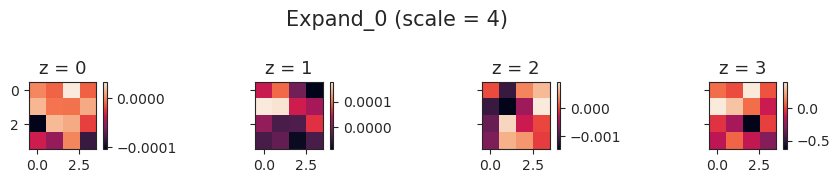

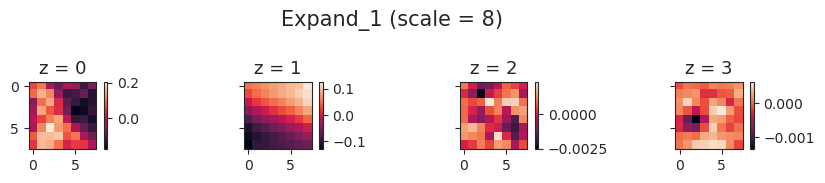

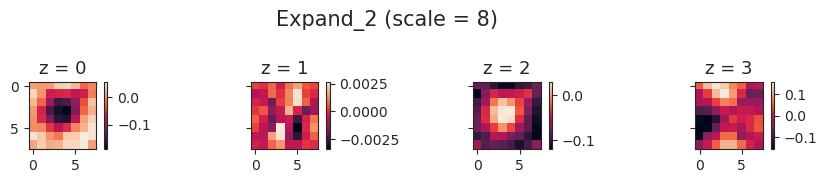

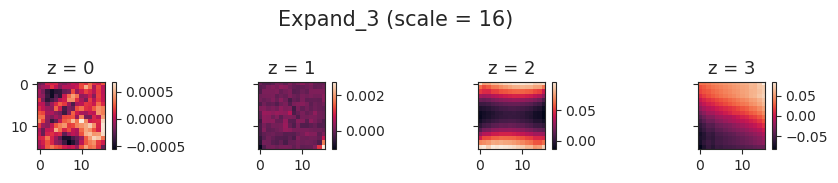

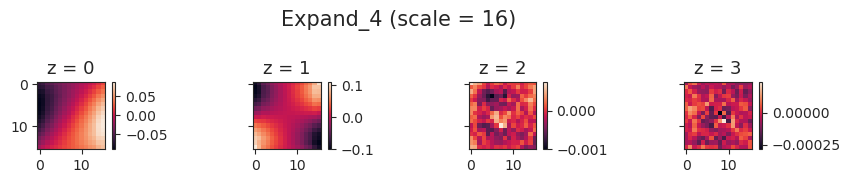

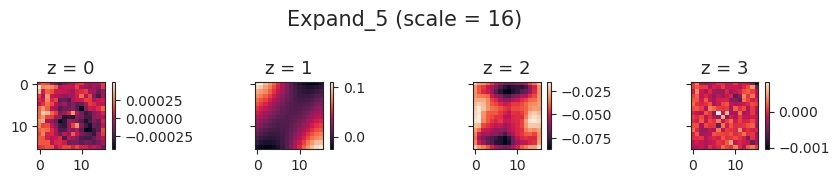

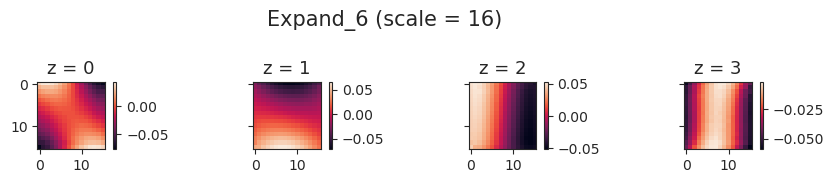

In [23]:
for i, _w in w2p.items():
    num = vae.cfg.n_latent_per_group
    fig, axes = create_figure(1, num, (9, 1.7), 'all', 'all', tight_layout=True)
    for z in range(num):
        ax = axes.flat[z]
        im = ax.imshow(_w[z, 0])
        plt.colorbar(im, ax=ax)
        ax.set_title(f'z = {z}', fontsize=13)
    fig.suptitle(f'Expand_{i} (scale = {scales[i]})', fontsize=15, y=1.02)
    plt.show()

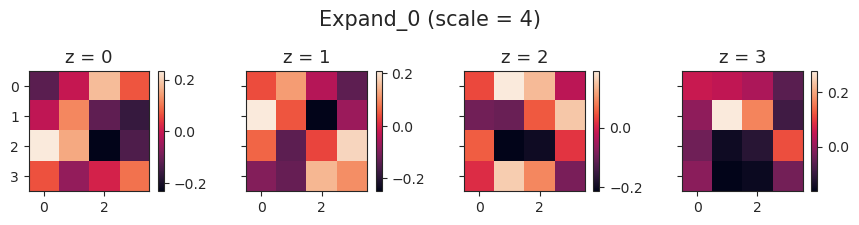

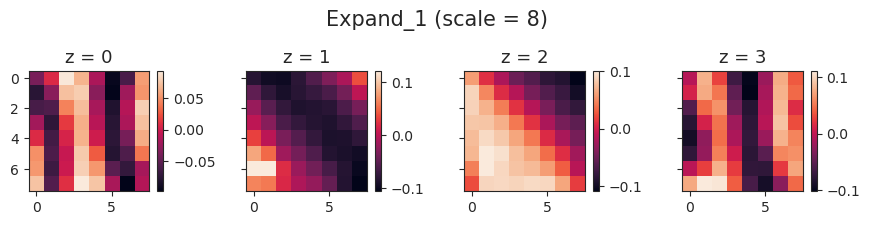

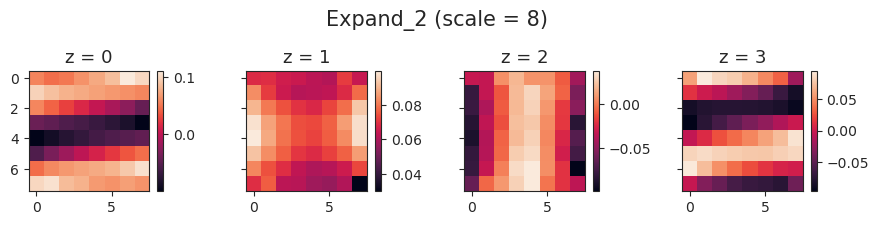

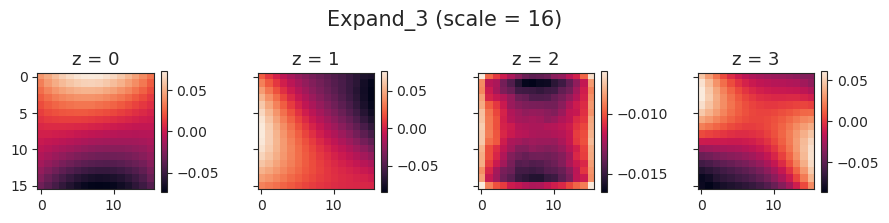

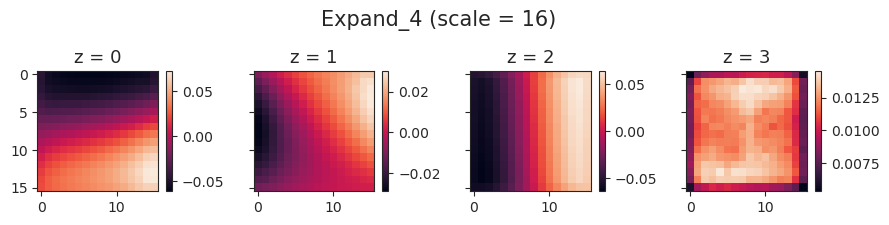

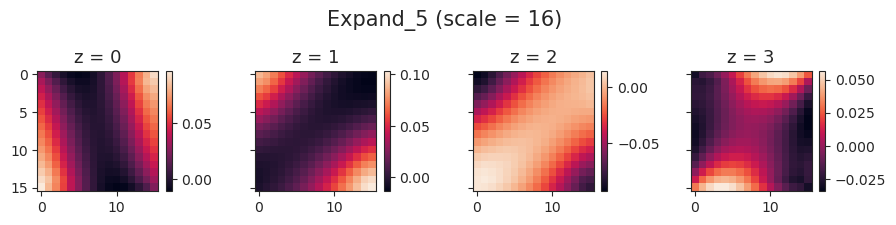

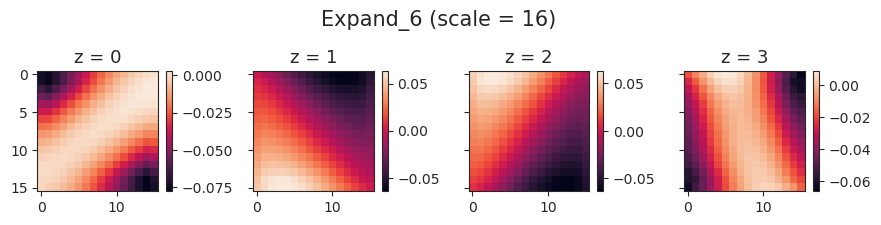

In [24]:
ticks = [
    i for i in range(len(s)) if
    i % vae.cfg.n_latent_per_group == 0
]
ticklabels = [i + 1 for i in ticks]

NameError: name 's' is not defined

In [82]:
val['z'].shape

(7500, 28)

In [187]:
u, s, v = sp_lin.svd(val['z'], full_matrices=False, compute_uv=True)
s *= 100 / s.sum()
u.shape, s.shape, v.shape

((7500, 28), (28,), (28, 28))

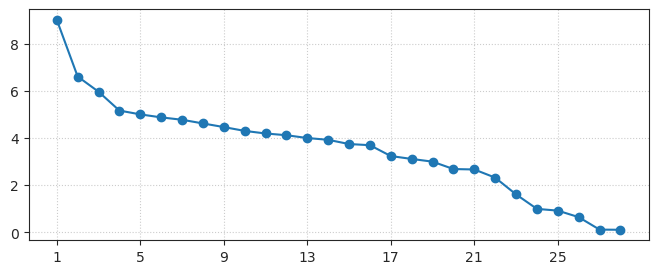

In [178]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(s, marker='o')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.grid()

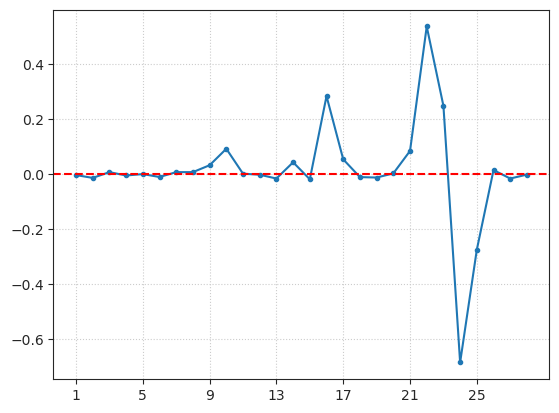

In [236]:
fig, ax = create_figure()
ax.plot(v[0], marker='.')
ax.axhline(0, color='r', ls='--')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.grid()
plt.show()

In [237]:
r = 1 - sp_dist.pdist(val['z'].T, 'correlation')
r = sp_dist.squareform(r)

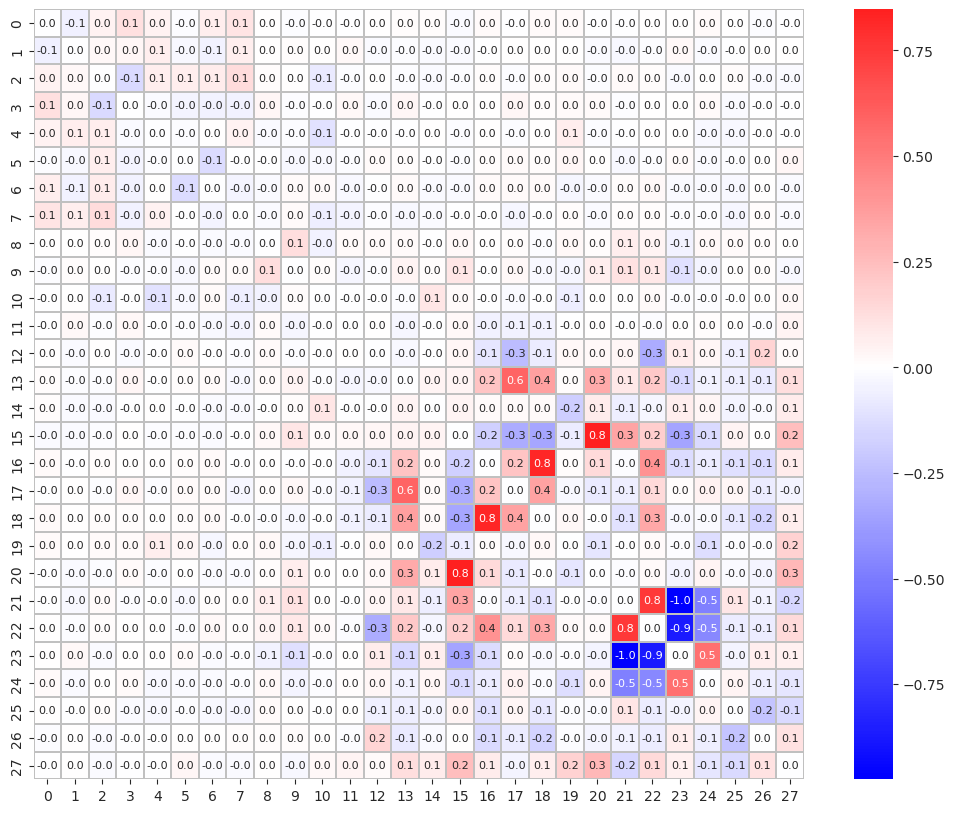

In [238]:
fig, ax = create_figure(1, 1, (13, 10))
sns.heatmap(
    r,
    center=0,
    cmap='bwr',
    linewidths=0.005,
    linecolor='silver',
    square=True,
    annot=True,
    fmt='.1f',
    annot_kws={'fontsize': 8},
    ax=ax,
);

In [257]:
# create datasets
f = pjoin(vae.cfg.data_dir, vae.cfg.h_pre)
f = h5py.File(f, mode='r')
fix = np.array(f['vld']['fix'], dtype=float)
pos_obj = np.array(f['vld']['pos_obj'], dtype=float)
vel_obj = np.array(f['vld']['vel_obj'], dtype=float)
vel_slf = np.array(f['vld']['vel_slf'], dtype=float)
f.close()

In [258]:
pos = dc(pos_obj)
pos[0] -= fix[:, 0]
pos[1] -= fix[:, 1]

In [259]:
g = np_nans((len(fix), 11))
g[:, :2] = fix
g[:, 2:5] = vel_slf.T
g[:, 5:8] = vel_obj.T
g[:, 8:11] = pos.T
g.shape

(7500, 11)

In [260]:
corr = 1 - sp_dist.pdist(g.T, metric='correlation')
corr = sp_dist.squareform(corr)
corr.shape

(11, 11)

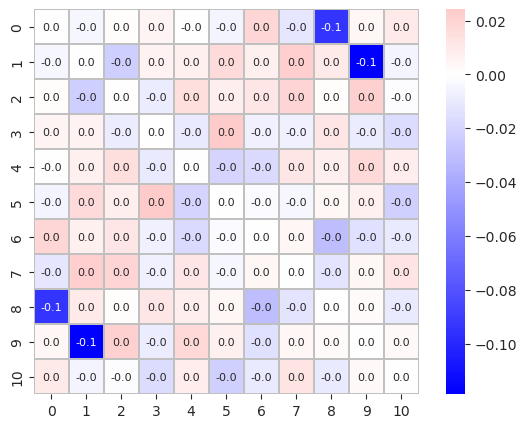

In [261]:
fig, ax = create_figure(1, 1, (7, 5))
sns.heatmap(
    corr,
    center=0,
    cmap='bwr',
    linewidths=0.005,
    linecolor='silver',
    square=True,
    annot=True,
    fmt='.1f',
    annot_kws={'fontsize': 8},
    ax=ax,
);

In [262]:
u_g, s_g, v_g = sp_lin.svd(g, full_matrices=False, compute_uv=True)
s_g *= 100 / s_g.sum()
u_g.shape, s_g.shape, v_g.shape

((7500, 11), (11,), (11, 11))

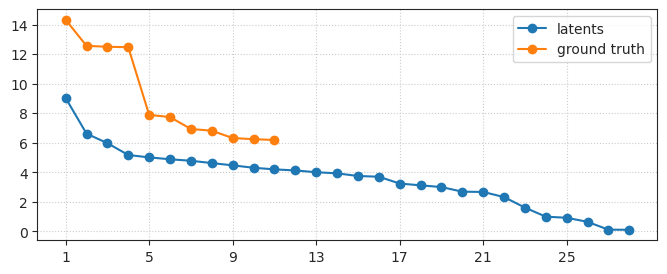

In [267]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(s, marker='o', label='latents')
ax.plot(s_g, marker='o', label='ground truth')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.legend()
ax.grid()

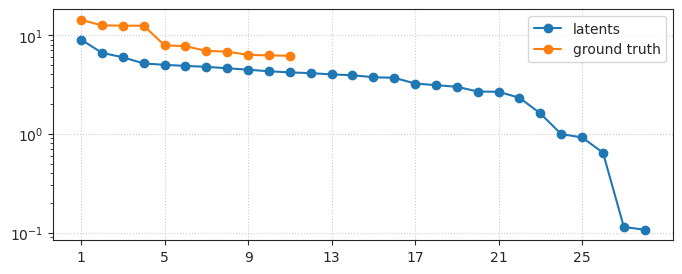

In [276]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(s, marker='o', label='latents')
ax.plot(s_g, marker='o', label='ground truth')
ax.set(xticks=ticks, xticklabels=ticklabels, yscale='log')
ax.legend()
ax.grid()

In [272]:
u_x, s_x, v_x = sp_lin.svd(
    flatten_arr(val['x'], ndim_start=1, ndim_end=0),
    full_matrices=False,
    compute_uv=True,
)
s_x *= 100 / s_x.sum()
u_x.shape, s_x.shape, v_x.shape

((7500, 722), (722,), (722, 722))

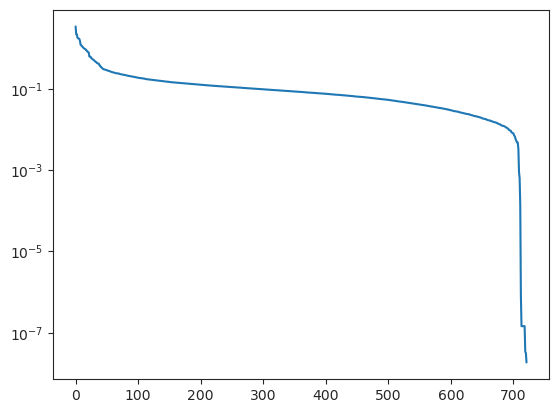

In [275]:
fig, ax = create_figure()
ax.plot(s_x)
ax.set_yscale('log')

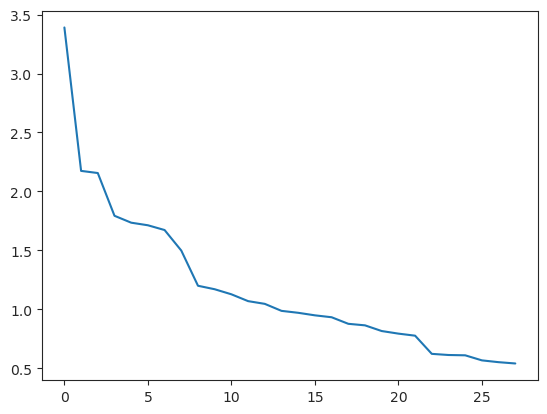

In [279]:
plt.plot(s_x[:28])

In [304]:
a = v_x[:64].reshape((64, 2, 19, 19))

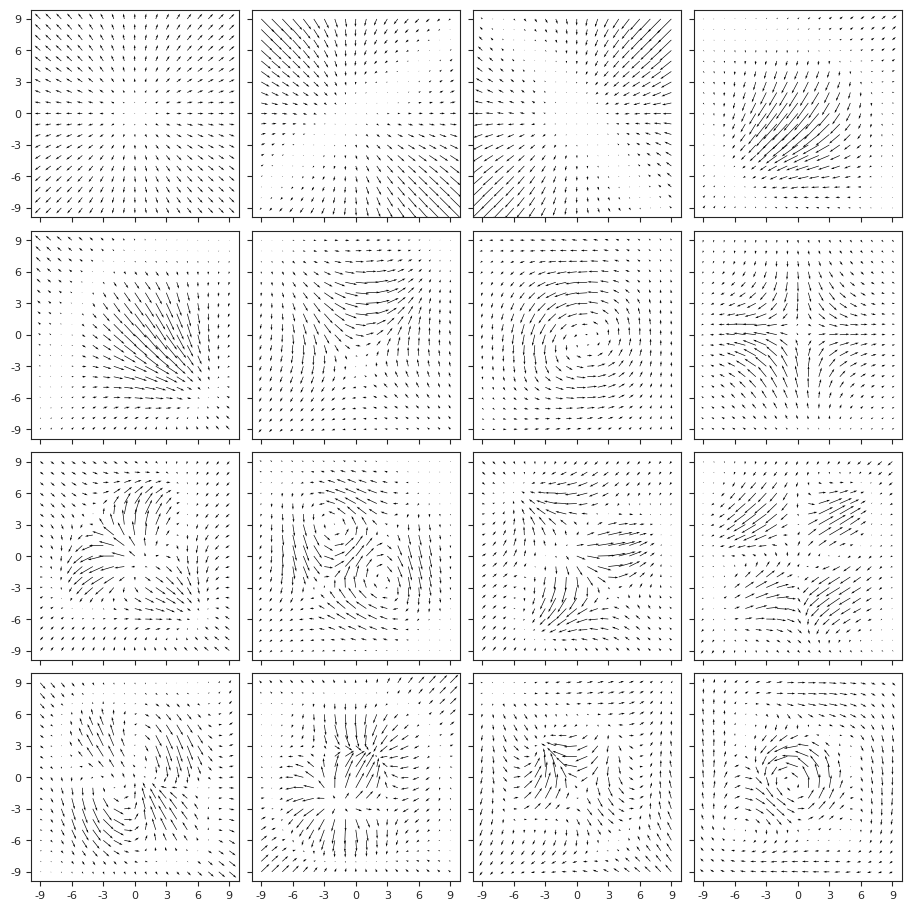

In [307]:
show_opticflow(a, 4);

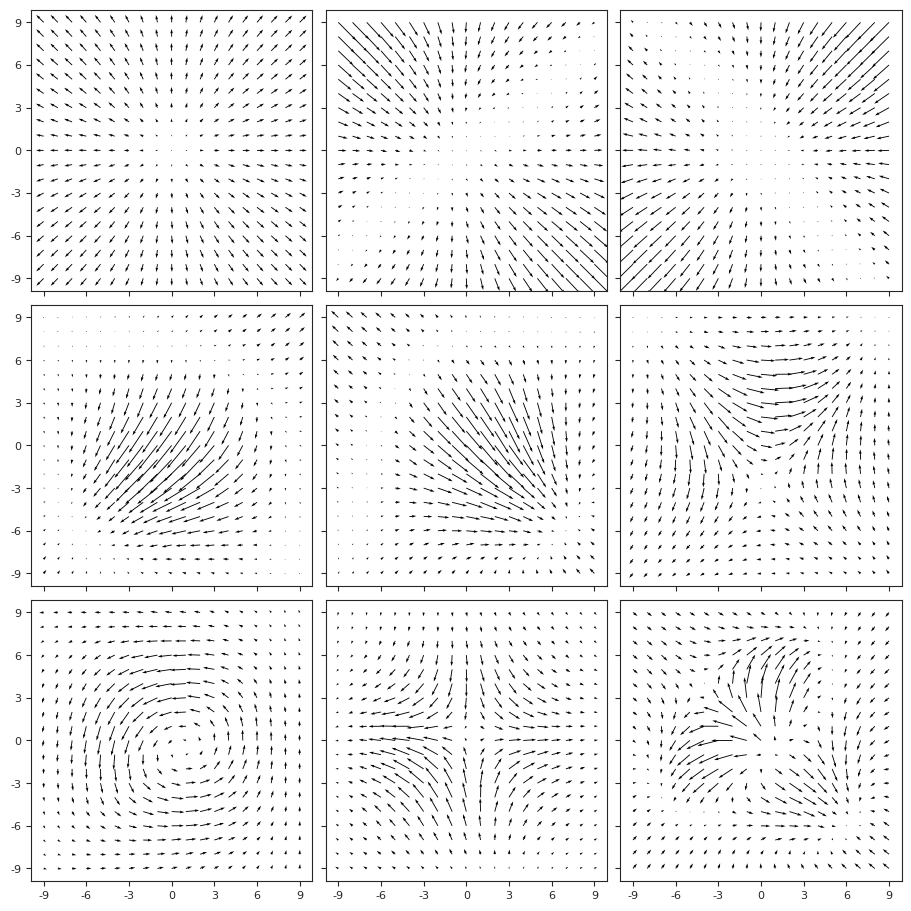

In [308]:
show_opticflow(a, 3);

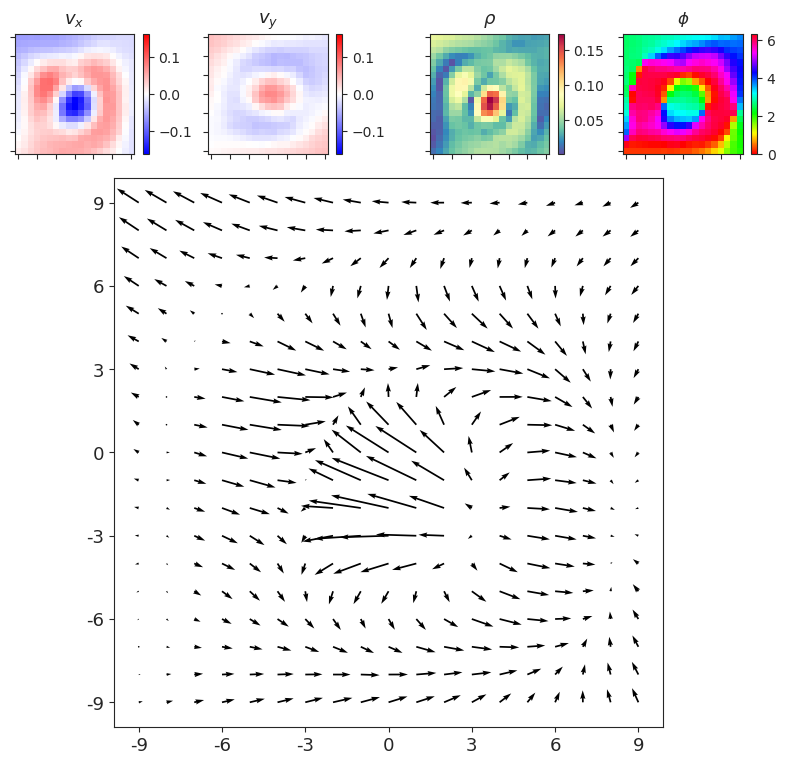

In [302]:
a = v_x[16].reshape((2, 19, 19))
show_opticflow_full(a);

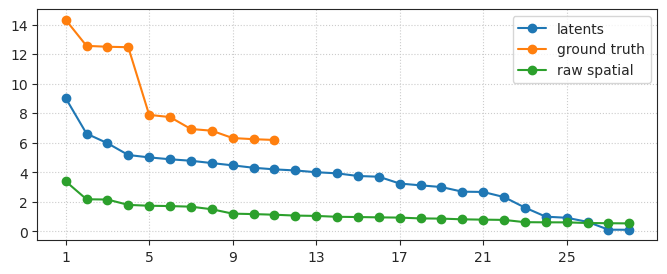

In [310]:
fig, ax = create_figure(figsize=(8, 3))
ax.plot(s, marker='o', label='latents')
ax.plot(s_g, marker='o', label='ground truth')
ax.plot(s_x[:28], marker='o', label='raw spatial')
ax.set(xticks=ticks, xticklabels=ticklabels)
ax.legend()
ax.grid()

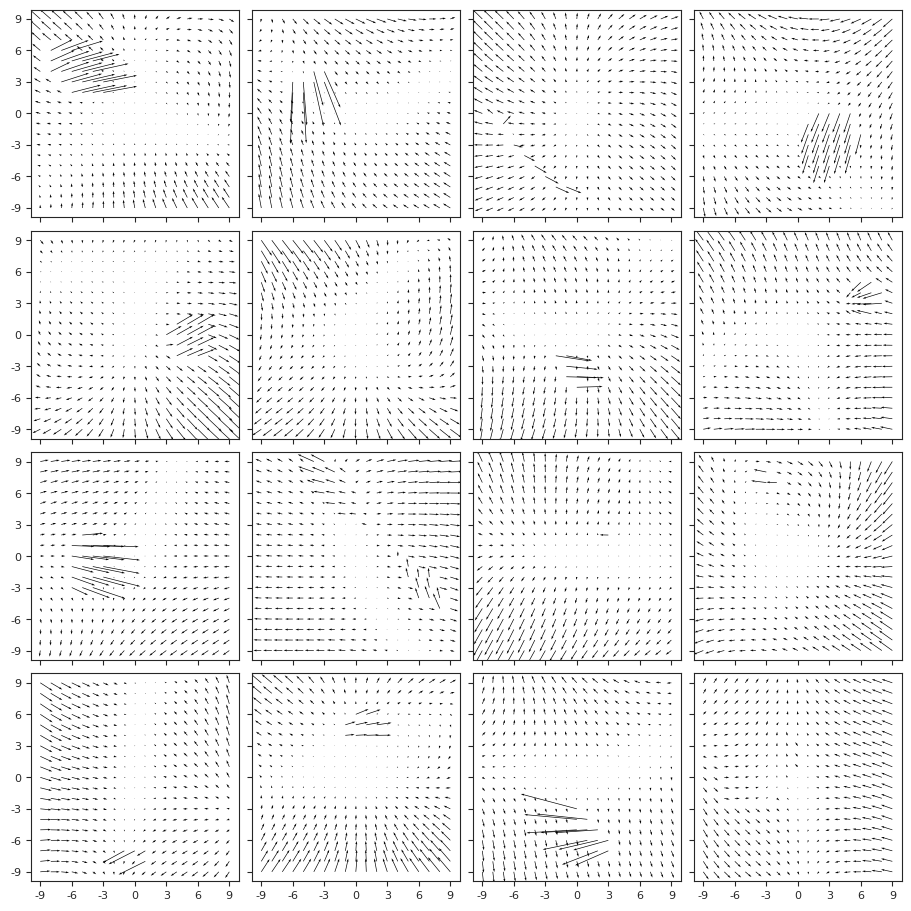

In [314]:
show_opticflow(val['y_sample'][2000:3000], 4);